In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats as scipy_stats
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import warnings
from typing import Dict, List, Any 
from sklearn.model_selection import GridSearchCV
from pathlib import Path
warnings.filterwarnings('ignore')


# Load BASELINE datasets
df_baseline_iowait = pd.read_csv("baseline/cpu_iowait.csv")
df_baseline_irq = pd.read_csv("baseline/cpu_irq.csv")
df_baseline_system_msec = pd.read_csv("baseline/cpu_system_msec.csv")
df_baseline_user_msec = pd.read_csv("baseline/cpu_user_msec.csv")
df_baseline_util_per = pd.read_csv("baseline/cpu_util_per.csv")

# Load CPU STRESS datasets
df_cpustress_iowait = pd.read_csv("cpu stress/cpu_iowait.csv")
df_cpustress_irq = pd.read_csv("cpu stress/cpu_irq.csv")
df_cpustress_system_msec = pd.read_csv("cpu stress/cpu_system_msec.csv")
df_cpustress_user_msec = pd.read_csv("cpu stress/cpu_user_msec.csv")
df_cpustress_util_per = pd.read_csv("cpu stress/cpu_util_per.csv")

# Load DELAY datasets
df_delay_iowait = pd.read_csv("delay/cpu_iowait.csv")
df_delay_irq = pd.read_csv("delay/cpu_irq.csv")
df_delay_system_msec = pd.read_csv("delay/cpu_system_msec.csv")
df_delay_user_msec = pd.read_csv("delay/cpu_user_msec.csv")
df_delay_util_per = pd.read_csv("delay/cpu_util_per.csv")

# Load MEM STRESS datasets
df_memstress_iowait = pd.read_csv("mem stress/cpu_iowait.csv")
df_memstress_irq = pd.read_csv("mem stress/cpu_irq.csv")
df_memstress_system_msec = pd.read_csv("mem stress/cpu_system_msec.csv")
df_memstress_user_msec = pd.read_csv("mem stress/cpu_user_msec.csv")
df_memstress_util_per = pd.read_csv("mem stress/cpu_util_per.csv")

# Load NET LOSS datasets
df_netloss_iowait = pd.read_csv("netloss/cpu_iowait.csv")
df_netloss_irq = pd.read_csv("netloss/cpu_irq.csv")
df_netloss_system_msec = pd.read_csv("netloss/cpu_system_msec.csv")
df_netloss_user_msec = pd.read_csv("netloss/cpu_user_msec.csv")
df_netloss_util_per = pd.read_csv("netloss/cpu_util_per.csv")


# Add source labels - BASELINE
df_baseline_iowait["source"] = "BASELINE"
df_baseline_irq["source"] = "BASELINE"
df_baseline_system_msec["source"] = "BASELINE"
df_baseline_user_msec["source"] = "BASELINE"
df_baseline_util_per["source"] = "BASELINE"

# Add source labels - CPU STRESS
df_cpustress_iowait["source"] = "CPU_STRESS"
df_cpustress_irq["source"] = "CPU_STRESS"
df_cpustress_system_msec["source"] = "CPU_STRESS"
df_cpustress_user_msec["source"] = "CPU_STRESS"
df_cpustress_util_per["source"] = "CPU_STRESS"

# Add source labels - DELAY
df_delay_iowait["source"] = "DELAY"
df_delay_irq["source"] = "DELAY"
df_delay_system_msec["source"] = "DELAY"
df_delay_user_msec["source"] = "DELAY"
df_delay_util_per["source"] = "DELAY"

# Add source labels - MEM STRESS
df_memstress_iowait["source"] = "MEM_STRESS"
df_memstress_irq["source"] = "MEM_STRESS"
df_memstress_system_msec["source"] = "MEM_STRESS"
df_memstress_user_msec["source"] = "MEM_STRESS"
df_memstress_util_per["source"] = "MEM_STRESS"

# Add source labels - NET LOSS
df_netloss_iowait["source"] = "NET_LOSS"
df_netloss_irq["source"] = "NET_LOSS"
df_netloss_system_msec["source"] = "NET_LOSS"
df_netloss_user_msec["source"] = "NET_LOSS"
df_netloss_util_per["source"] = "NET_LOSS"


# Convert to datetime - BASELINE
df_baseline_iowait["Time"] = pd.to_datetime(df_baseline_iowait["Time"])
df_baseline_irq["Time"] = pd.to_datetime(df_baseline_irq["Time"])
df_baseline_system_msec["Time"] = pd.to_datetime(df_baseline_system_msec["Time"])
df_baseline_user_msec["Time"] = pd.to_datetime(df_baseline_user_msec["Time"])
df_baseline_util_per["Time"] = pd.to_datetime(df_baseline_util_per["Time"])

# Convert to datetime - CPU STRESS
df_cpustress_iowait["Time"] = pd.to_datetime(df_cpustress_iowait["Time"])
df_cpustress_irq["Time"] = pd.to_datetime(df_cpustress_irq["Time"])
df_cpustress_system_msec["Time"] = pd.to_datetime(df_cpustress_system_msec["Time"])
df_cpustress_user_msec["Time"] = pd.to_datetime(df_cpustress_user_msec["Time"])
df_cpustress_util_per["Time"] = pd.to_datetime(df_cpustress_util_per["Time"])

# Convert to datetime - DELAY
df_delay_iowait["Time"] = pd.to_datetime(df_delay_iowait["Time"])
df_delay_irq["Time"] = pd.to_datetime(df_delay_irq["Time"])
df_delay_system_msec["Time"] = pd.to_datetime(df_delay_system_msec["Time"])
df_delay_user_msec["Time"] = pd.to_datetime(df_delay_user_msec["Time"])
df_delay_util_per["Time"] = pd.to_datetime(df_delay_util_per["Time"])

# Convert to datetime - MEM STRESS
df_memstress_iowait["Time"] = pd.to_datetime(df_memstress_iowait["Time"])
df_memstress_irq["Time"] = pd.to_datetime(df_memstress_irq["Time"])
df_memstress_system_msec["Time"] = pd.to_datetime(df_memstress_system_msec["Time"])
df_memstress_user_msec["Time"] = pd.to_datetime(df_memstress_user_msec["Time"])
df_memstress_util_per["Time"] = pd.to_datetime(df_memstress_util_per["Time"])

# Convert to datetime - NET LOSS
df_netloss_iowait["Time"] = pd.to_datetime(df_netloss_iowait["Time"])
df_netloss_irq["Time"] = pd.to_datetime(df_netloss_irq["Time"])
df_netloss_system_msec["Time"] = pd.to_datetime(df_netloss_system_msec["Time"])
df_netloss_user_msec["Time"] = pd.to_datetime(df_netloss_user_msec["Time"])
df_netloss_util_per["Time"] = pd.to_datetime(df_netloss_util_per["Time"])


delay = 30
duration = 50

# Synchronize all datasets with baseline timeline
time_offset = df_baseline_iowait["Time"].min()

# Synchronize CPU STRESS datasets
cpustress_offset = time_offset - df_cpustress_iowait["Time"].min()
df_cpustress_iowait["Time"] += cpustress_offset
df_cpustress_irq["Time"] += cpustress_offset
df_cpustress_system_msec["Time"] += cpustress_offset
df_cpustress_user_msec["Time"] += cpustress_offset
df_cpustress_util_per["Time"] += cpustress_offset

# Synchronize DELAY datasets
delay_offset = time_offset - df_delay_iowait["Time"].min()
df_delay_iowait["Time"] += delay_offset
df_delay_irq["Time"] += delay_offset
df_delay_system_msec["Time"] += delay_offset
df_delay_user_msec["Time"] += delay_offset
df_delay_util_per["Time"] += delay_offset

# Synchronize MEM STRESS datasets
memstress_offset = time_offset - df_memstress_iowait["Time"].min()
df_memstress_iowait["Time"] += memstress_offset
df_memstress_irq["Time"] += memstress_offset
df_memstress_system_msec["Time"] += memstress_offset
df_memstress_user_msec["Time"] += memstress_offset
df_memstress_util_per["Time"] += memstress_offset

# Synchronize NET LOSS datasets
netloss_offset = time_offset - df_netloss_iowait["Time"].min()
df_netloss_iowait["Time"] += netloss_offset
df_netloss_irq["Time"] += netloss_offset
df_netloss_system_msec["Time"] += netloss_offset
df_netloss_user_msec["Time"] += netloss_offset
df_netloss_util_per["Time"] += netloss_offset


# Convert timeline to minutes for ALL datasets
all_dfs = [
    # Baseline
    df_baseline_iowait, df_baseline_irq, df_baseline_system_msec, df_baseline_user_msec, df_baseline_util_per,
    # CPU Stress
    df_cpustress_iowait, df_cpustress_irq, df_cpustress_system_msec, df_cpustress_user_msec, df_cpustress_util_per,
    # Delay
    df_delay_iowait, df_delay_irq, df_delay_system_msec, df_delay_user_msec, df_delay_util_per,
    # Memory Stress
    df_memstress_iowait, df_memstress_irq, df_memstress_system_msec, df_memstress_user_msec, df_memstress_util_per,
    # Network Loss
    df_netloss_iowait, df_netloss_irq, df_netloss_system_msec, df_netloss_user_msec, df_netloss_util_per
]

for df in all_dfs:
    df["Minutes"] = (df["Time"] - df["Time"].min()).dt.total_seconds() / 60

# COMPLETE DATASETS DICTIONARY 
all_datasets = {
    'IOWait': {
        'baseline': df_baseline_iowait,
        'cpu_stress': df_cpustress_iowait,
        'delay': df_delay_iowait,
        'mem_stress': df_memstress_iowait,
        'net_loss': df_netloss_iowait,
    },
    'IRQ': {
        'baseline': df_baseline_irq,
        'cpu_stress': df_cpustress_irq,
        'delay': df_delay_irq,
        'mem_stress': df_memstress_irq,
        'net_loss': df_netloss_irq,
    },
    'System': {
        'baseline': df_baseline_system_msec,
        'cpu_stress': df_cpustress_system_msec,
        'delay': df_delay_system_msec,
        'mem_stress': df_memstress_system_msec,
        'net_loss': df_netloss_system_msec,
    },
    'User': {
        'baseline': df_baseline_user_msec,
        'cpu_stress': df_cpustress_user_msec,
        'delay': df_delay_user_msec,
        'mem_stress': df_memstress_user_msec,
        'net_loss': df_netloss_user_msec,
    },
    'Utilization': {
        'baseline': df_baseline_util_per,
        'cpu_stress': df_cpustress_util_per,
        'delay': df_delay_util_per,
        'mem_stress': df_memstress_util_per,
        'net_loss': df_netloss_util_per,
    }
}

print("✅ All datasets loaded successfully!")
print(f"📊 Loaded {len(all_datasets)} metrics across {len(all_datasets['IOWait'])} experiment types")
print("\nDataset structure:")
for metric, experiments in all_datasets.items():
    print(f"  {metric}: {list(experiments.keys())}")

✅ All datasets loaded successfully!
📊 Loaded 5 metrics across 5 experiment types

Dataset structure:
  IOWait: ['baseline', 'cpu_stress', 'delay', 'mem_stress', 'net_loss']
  IRQ: ['baseline', 'cpu_stress', 'delay', 'mem_stress', 'net_loss']
  System: ['baseline', 'cpu_stress', 'delay', 'mem_stress', 'net_loss']
  User: ['baseline', 'cpu_stress', 'delay', 'mem_stress', 'net_loss']
  Utilization: ['baseline', 'cpu_stress', 'delay', 'mem_stress', 'net_loss']



Processing IOWait
  Training model for cpu 0...
    ✅ Model trained for cpu 0
  Training model for cpu 1...
    ✅ Model trained for cpu 1
  Training model for cpu 2...
    ✅ Model trained for cpu 2
  Training model for cpu 3...
    ✅ Model trained for cpu 3
  Training model for cpu 4...
    ✅ Model trained for cpu 4
  Training model for cpu 5...
    ✅ Model trained for cpu 5
  Training model for cpu 6...
    ✅ Model trained for cpu 6
  Training model for cpu 7...
    ✅ Model trained for cpu 7
  Training model for cpu 8...
    ✅ Model trained for cpu 8
  Training model for cpu 9...
    ✅ Model trained for cpu 9
  Processing experiment: baseline
    Processing column: cpu 0
      ✅ cpu 0: 280 outliers, 32.9% noise reduction
    Processing column: cpu 1
      ✅ cpu 1: 255 outliers, 40.6% noise reduction
    Processing column: cpu 2
      ✅ cpu 2: 244 outliers, 30.3% noise reduction
    Processing column: cpu 3
      ✅ cpu 3: 234 outliers, 33.3% noise reduction
    Processing column: cpu 

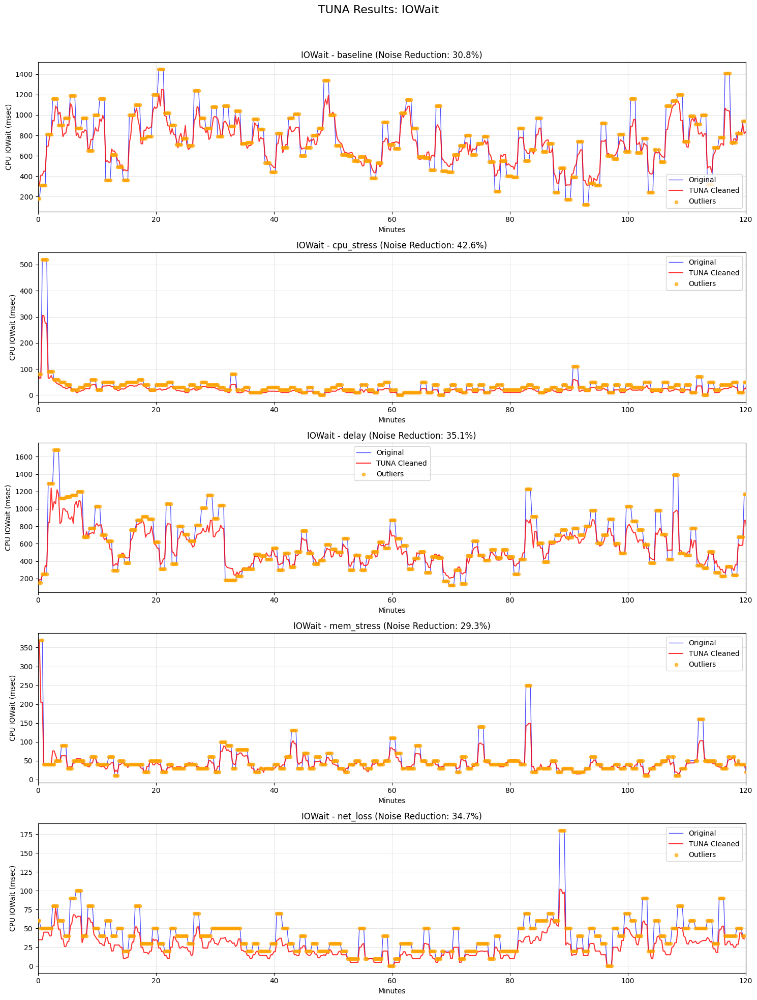

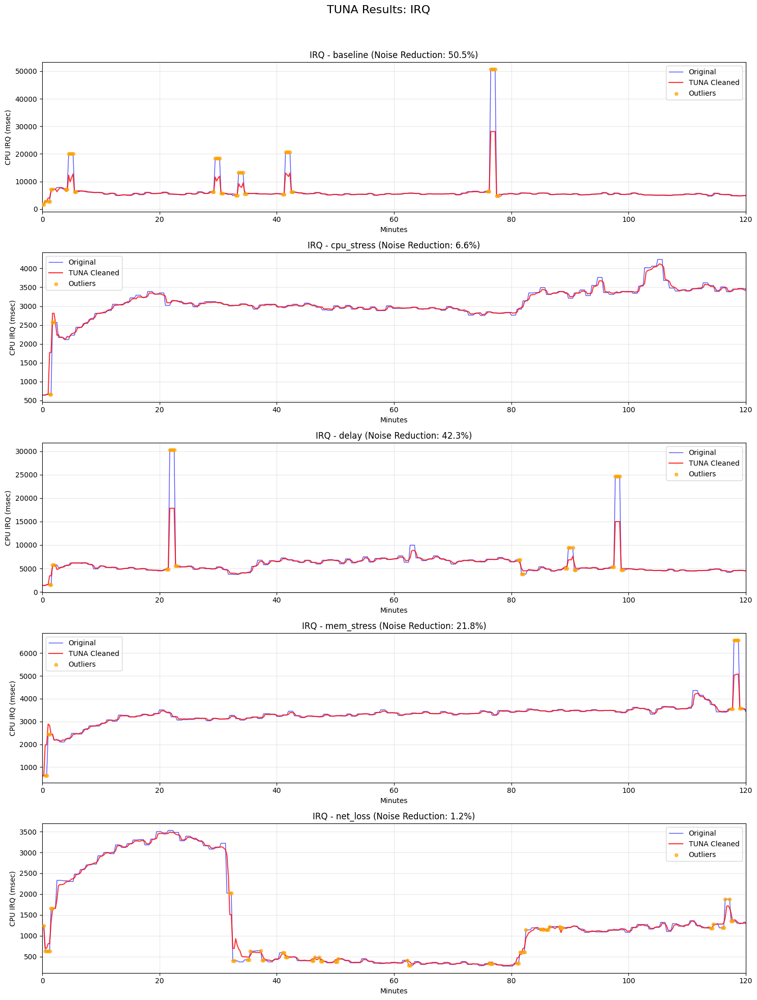

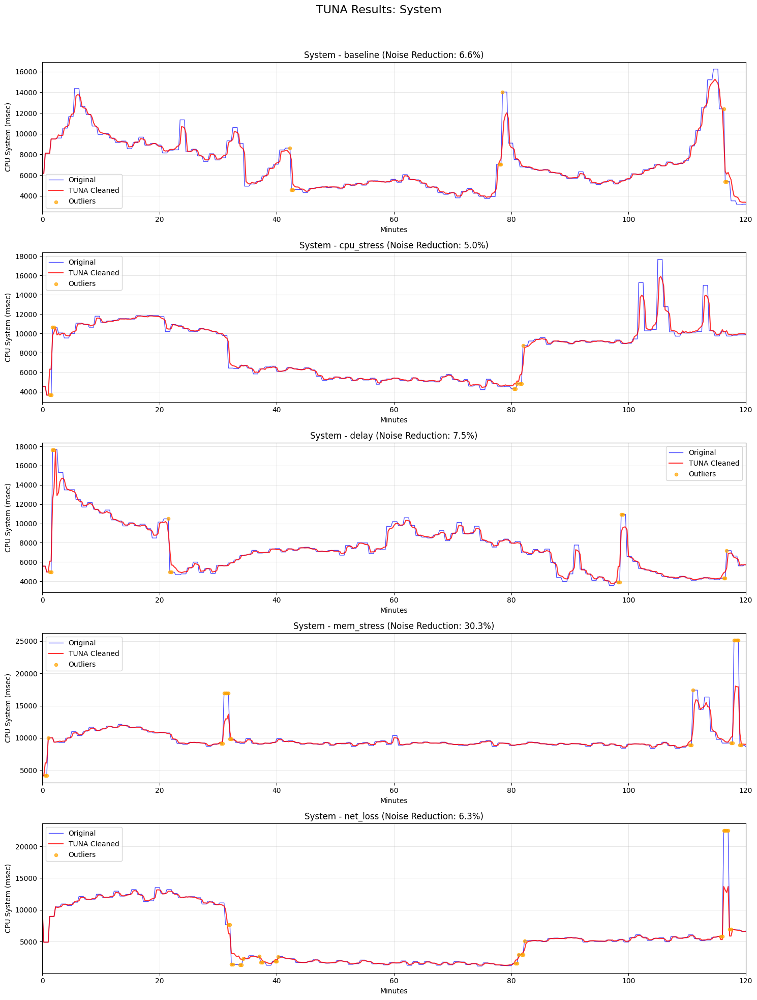

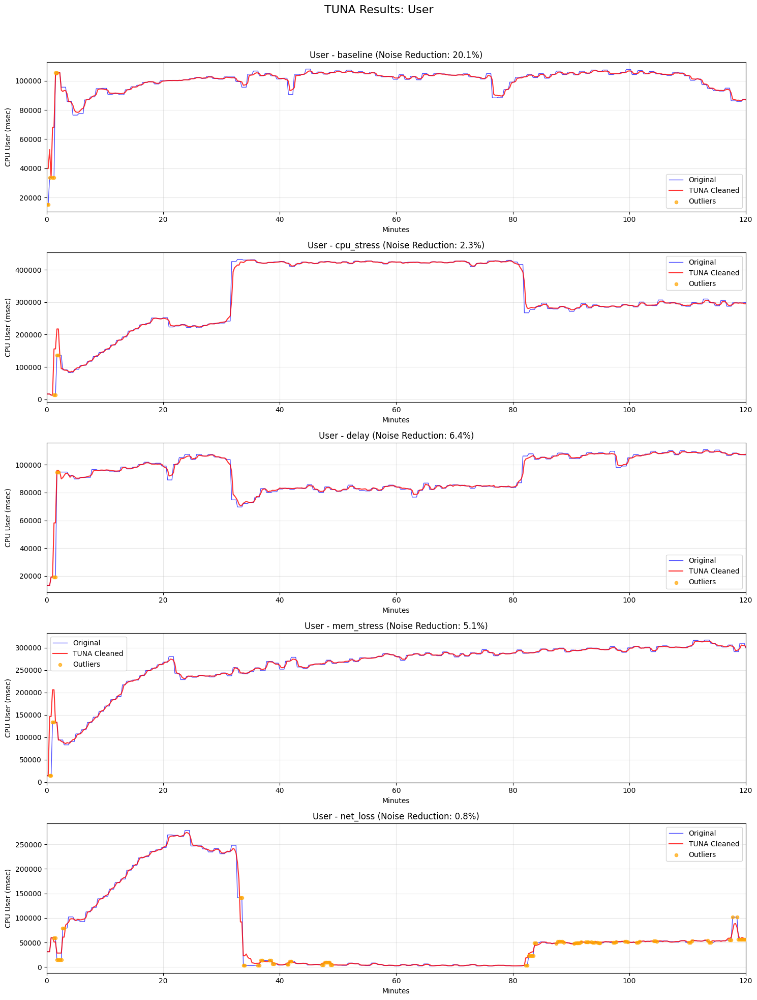

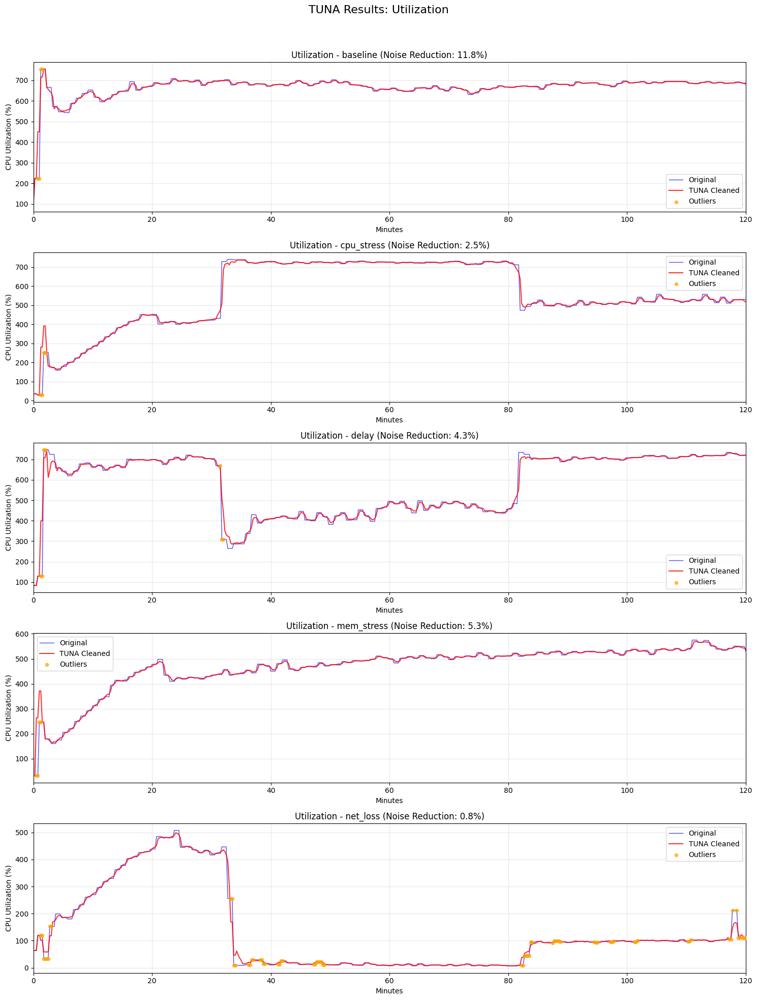


TUNA Results Summary:
Metric       Experiment   Outliers   Noise Red%   Correlation 
------------------------------------------------------------
IOWait       baseline     2099             30.8%       0.949
IOWait       cpu_stress   2121             42.6%       0.986
IOWait       delay        2164             35.1%       0.959
IOWait       mem_stress   2327             29.3%       0.937
IOWait       net_loss     1800             34.7%       0.941
IRQ          baseline     299              50.5%       0.991
IRQ          cpu_stress   28                6.6%       0.980
IRQ          delay        192              42.3%       0.957
IRQ          mem_stress   39               21.8%       0.950
IRQ          net_loss     127               1.2%       0.997
System       baseline     33                6.6%       0.979
System       cpu_stress   37                5.0%       0.980
System       delay        69                7.5%       0.978
System       mem_stress   63               30.3%       0.933

In [9]:
def calculate_cumulative_cpu(df):
    """Calculate total CPU from all CPU columns"""
    exclude_cols = ['Time', 'Minutes', 'source']
    cpu_cols = [col for col in df.columns if col not in exclude_cols]
    return df[cpu_cols].sum(axis=1).values

def detect_outliers_tuna(timeseries, window_size=3, threshold=0.85, min_absolute_range=None):
    """
    TUNA's relative range outlier detection with stability improvements
    Formula: (max - min) / mean > threshold
    Mark only the max/min values in unstable windows as outliers
    """
    outlier_mask = np.zeros(len(timeseries), dtype=bool)
    
    # Calculate adaptive minimum absolute range if not provided
    if min_absolute_range is None:
        min_absolute_range = 0.2 * np.std(timeseries)
    
    # Slide window across time series to detect unstable periods
    for i in range(len(timeseries) - window_size + 1):
        window = timeseries[i:i + window_size]
        window_mean = np.mean(window)
        window_range = np.max(window) - np.min(window)
        
        if window_mean > 0:
            # Apply TUNA relative range criterion
            relative_range = window_range / window_mean
            
            # Require minimum absolute range to avoid hypersensitivity
            if relative_range > threshold and window_range > min_absolute_range:
                window_max = np.max(window)
                window_min = np.min(window)
                
                # Mark extreme values within unstable window
                for j in range(window_size):
                    actual_idx = i + j
                    if (timeseries[actual_idx] == window_max or 
                        timeseries[actual_idx] == window_min):
                        outlier_mask[actual_idx] = True
    
    return outlier_mask

def create_features_for_ml(timeseries, experiment_type, window_size=10):
    """Create features for RandomForest training"""
    features = []
    
    # Extract temporal and statistical features from sliding windows
    for i in range(window_size, len(timeseries)):
        window = timeseries[i-window_size:i]
        
        # Statistical features from recent history
        feature_vector = [
            np.mean(window),                    # Rolling average
            np.std(window),                     # Variability measure
            np.median(window),                  # Robust central tendency
            np.max(window) - np.min(window),    # Range indicator
            timeseries[i-1],                    # Previous value dependency
            i / len(timeseries),                # Temporal position
        ]
        
        # Experiment context encoding for cross-experiment learning
        exp_features = [0, 0, 0, 0, 0]
        if experiment_type == "baseline":
            exp_features[0] = 1
        elif experiment_type == "cpu_stress":
            exp_features[1] = 1
        elif experiment_type == "delay":
            exp_features[2] = 1
        elif experiment_type == "mem_stress":
            exp_features[3] = 1
        elif experiment_type == "net_loss":
            exp_features[4] = 1
        
        feature_vector.extend(exp_features)
        features.append(feature_vector)
    
    return np.array(features)

def train_random_forest_for_metric(metric_name, all_experiments):
    """Train RandomForest on stable periods across all experiments"""
    print(f"Training {metric_name}...")
    
    X_stable_all = []
    y_stable_all = []
    
    # Aggregate stable training data from all experimental conditions
    for exp_name, df in all_experiments.items():
        cumulative = calculate_cumulative_cpu(df)
        outlier_mask = detect_outliers_tuna(cumulative)
        stable_mask = ~outlier_mask
        
        features = create_features_for_ml(cumulative, exp_name)
        # Align feature window with stability detection
        stable_features_mask = stable_mask[10:]
        stable_features = features[stable_features_mask]
        stable_targets = cumulative[10:][stable_features_mask]
        
        if len(stable_features) > 0:
            # Apply local smoothing to targets for better generalization
            smoothed_targets = []
            for j, target in enumerate(stable_targets):
                start_idx = max(0, j-2)
                end_idx = min(len(stable_targets), j+3)
                local_values = stable_targets[start_idx:end_idx]
                smoothed_targets.append(np.median(local_values))
            
            X_stable_all.extend(stable_features)
            y_stable_all.extend(smoothed_targets)
    
    X_stable_all = np.array(X_stable_all)
    y_stable_all = np.array(y_stable_all)
    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_stable_all)

    param_grid = {
        'n_estimators': [100],
        'max_depth': [5, 10, 15],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['sqrt', 'log2']
    }
    
    model = RandomForestRegressor(
        criterion='squared_error',
        bootstrap=True,
        n_jobs=-1,
        random_state=42
    )

    grid_search = GridSearchCV(
        estimator=model,
        param_grid=param_grid,
        scoring='neg_mean_squared_error',
        cv=3,
        n_jobs=-1,
        verbose=0
    )
    
    grid_search.fit(X_scaled, y_stable_all)
    model = grid_search.best_estimator_
    
    return model, scaler

def apply_penalty(timeseries, outlier_mask, penalty_factor=0.5):
    """Apply penalty to outliers by reducing their deviation from baseline"""
    cleaned_series = timeseries.copy()
    
    stable_values = timeseries[~outlier_mask]
    if len(stable_values) > 0:
        baseline = np.median(stable_values)
    else:
        baseline = np.median(timeseries)
    
    # Reduce outlier magnitude toward baseline (graphic fix)
    for i in range(len(timeseries)):
        if outlier_mask[i]:
            original_value = timeseries[i]
            cleaned_series[i] = baseline + (original_value - baseline) * penalty_factor
    
    return cleaned_series

def apply_tuna_to_single_series(cumulative, exp_name, model, scaler, penalty_factor=0.5, blend_weight=1):
    """Apply TUNA cleaning to a single time series"""
    
    # Phase 1: Identify unstable measurements
    outlier_mask = detect_outliers_tuna(cumulative)
    stable_mask = ~outlier_mask
    outliers_count = np.sum(outlier_mask)
    
    # Phase 2: Apply penalty to unstable measurements
    cleaned_series = apply_penalty(cumulative, outlier_mask, penalty_factor)
    
    # Phase 3: Enhance stable regions with ML predictions
    if model is not None and scaler is not None:
        features = create_features_for_ml(cumulative, exp_name)
        features_scaled = scaler.transform(features)
        ml_predictions = model.predict(features_scaled)
        
        for i, prediction in enumerate(ml_predictions):
            actual_idx = i + 10 
            if actual_idx < len(cleaned_series) and stable_mask[actual_idx]:
                original_value = cumulative[actual_idx]
                cleaned_series[actual_idx] = (
                    blend_weight * prediction + 
                    (1 - blend_weight) * original_value
                )
    
    original_std = np.std(cumulative)
    cleaned_std = np.std(cleaned_series)
    noise_reduction = (original_std - cleaned_std) / original_std * 100
    correlation = np.corrcoef(cumulative, cleaned_series)[0, 1]
    
    return cleaned_series, outlier_mask, {
        'outliers': outliers_count,
        'noise_reduction': noise_reduction,
        'correlation': correlation
    }

def apply_tuna_to_each_column(df, exp_name, models, scalers, penalty_factor=0.5, blend_weight=1):
    """Apply TUNA cleaning to each column individually"""
    
    exclude_cols = ['Time', 'Minutes', 'source']
    value_cols = [col for col in df.columns if col not in exclude_cols]
    
    # Results storage
    column_results = {}
    cleaned_df = df.copy()
    
    # Process each column individually
    for col in value_cols:
        print(f"    Processing column: {col}")
        
        col_values = df[col].values
        
        model = models.get(col)
        scaler = scalers.get(col)
        
        cleaned_values, outlier_mask, stats = apply_tuna_to_single_series(
            col_values, exp_name, model, scaler, penalty_factor, blend_weight
        )
        
        column_results[col] = {
            'original': col_values,
            'cleaned': cleaned_values,
            'outliers': outlier_mask,
            'stats': stats
        }
        
        cleaned_df[col] = cleaned_values
        
        print(f"      ✅ {col}: {stats['outliers']} outliers, {stats['noise_reduction']:.1f}% noise reduction")
    
    return cleaned_df, column_results

def train_models_for_all_columns(metric_name, all_experiments):
    """Train separate RandomForest models for each column"""
    
    exclude_cols = ['Time', 'Minutes', 'source']
    
    first_df = list(all_experiments.values())[0]
    value_cols = [col for col in first_df.columns if col not in exclude_cols]
    
    models = {}
    scalers = {}
    
    # Train a separate model for each column
    for col in value_cols:
        print(f"  Training model for {col}...")
        
        X_stable_all = []
        y_stable_all = []
        
        # Aggregate stable training data for this column across all experiments
        for exp_name, df in all_experiments.items():
            col_values = df[col].values
            outlier_mask = detect_outliers_tuna(col_values)
            stable_mask = ~outlier_mask
            
            features = create_features_for_ml(col_values, exp_name)
            # Align feature window with stability detection
            stable_features_mask = stable_mask[10:]
            stable_features = features[stable_features_mask]
            stable_targets = col_values[10:][stable_features_mask]
            
            if len(stable_features) > 0:
                smoothed_targets = []
                for j, target in enumerate(stable_targets):
                    start_idx = max(0, j-2)
                    end_idx = min(len(stable_targets), j+3)
                    local_values = stable_targets[start_idx:end_idx]
                    smoothed_targets.append(np.median(local_values))
                
                X_stable_all.extend(stable_features)
                y_stable_all.extend(smoothed_targets)
        
        # Train model for this column if we have enough data
        if len(X_stable_all) >= 10:
            X_stable_all = np.array(X_stable_all)
            y_stable_all = np.array(y_stable_all)
            
            # Standardize features
            scaler = StandardScaler()
            X_scaled = scaler.fit_transform(X_stable_all)
            
            # Train model
            param_grid = {
                'n_estimators': [100],
                'max_depth': [5, 10, 15],
                'min_samples_split': [2, 5],
                'min_samples_leaf': [1, 2, 4],
                'max_features': ['sqrt', 'log2']
            }
            
            model = RandomForestRegressor(
                criterion='squared_error',
                bootstrap=True,
                n_jobs=-1,
                random_state=42
            )
            
            grid_search = GridSearchCV(
                estimator=model,
                param_grid=param_grid,
                scoring='neg_mean_squared_error',
                cv=3,
                n_jobs=-1,
                verbose=0
            )
            
            grid_search.fit(X_scaled, y_stable_all)
            
            models[col] = grid_search.best_estimator_
            scalers[col] = scaler
            
            print(f"    ✅ Model trained for {col}")
        else:
            print(f"    ⚠ Insufficient data for {col} ({len(X_stable_all)} samples)")
            models[col] = None
            scalers[col] = None
    
    return models, scalers

def run_tuna_for_all_metrics_by_column():
    """Run TUNA for all metrics, processing each column individually"""    
    tuna_results = {}
    
    # Process each performance metric independently
    for metric_name, experiments in all_datasets.items():
        print(f"\nProcessing {metric_name}")
        
        # Train separate models for each column in this metric
        models, scalers = train_models_for_all_columns(metric_name, experiments)
        
        # Apply cleaning to each experimental condition
        metric_results = {}
        for exp_name, df in experiments.items():
            print(f"  Processing experiment: {exp_name}")
            
            # Apply TUNA to each column
            cleaned_df, column_results = apply_tuna_to_each_column(
                df, exp_name, models, scalers
            )
            
            # Calculate overall statistics
            total_outliers = sum(result['stats']['outliers'] for result in column_results.values())
            
            exclude_cols = ['Time', 'Minutes', 'source']
            value_cols = [col for col in df.columns if col not in exclude_cols]
            
            # Original and cleaned cumulative for overall metrics
            original_cumulative = df[value_cols].sum(axis=1).values
            cleaned_cumulative = cleaned_df[value_cols].sum(axis=1).values
            
            # Overall statistics
            original_std = np.std(original_cumulative)
            cleaned_std = np.std(cleaned_cumulative)
            noise_reduction = (original_std - cleaned_std) / original_std * 100 if original_std > 0 else 0
            correlation = np.corrcoef(original_cumulative, cleaned_cumulative)[0, 1]
            
            # Create overall outlier mask (union of all column outliers)
            overall_outlier_mask = np.zeros(len(df), dtype=bool)
            for col_result in column_results.values():
                overall_outlier_mask |= col_result['outliers']
            
            metric_results[exp_name] = {
                'original': original_cumulative,  # For compatibility with plotting
                'cleaned': cleaned_cumulative,    # For compatibility with plotting
                'outliers': overall_outlier_mask, # For compatibility with plotting
                'stats': {
                    'outliers': total_outliers,
                    'noise_reduction': noise_reduction,
                    'correlation': correlation
                },
                'column_results': column_results,  
                'cleaned_df': cleaned_df          
            }
        
        tuna_results[metric_name] = metric_results
    
    return tuna_results

def plot_tuna_results(tuna_results):
    """Plot TUNA results with original vs cleaned comparison using Minutes (0-120) x-axis"""
    
    for metric_name, metric_results in tuna_results.items():
        n_experiments = len(metric_results)
        fig, axes = plt.subplots(n_experiments, 1, figsize=(15, 4*n_experiments))
        
        if n_experiments == 1:
            axes = [axes]
        
        # Visualize cleaning results for each experiment
        for i, (exp_name, results) in enumerate(metric_results.items()):
            original = results['original']
            cleaned = results['cleaned']
            outliers = results['outliers']
            stats = results['stats']
            
            df = all_datasets[metric_name][exp_name]
            minutes = df['Minutes'].values
            
            axes[i].plot(minutes, original, 'b-', alpha=0.7, label='Original', linewidth=1)
            axes[i].plot(minutes, cleaned, 'r-', alpha=0.8, label='TUNA Cleaned', linewidth=1.5)
            
            # Highlight detected outliers
            outlier_points = np.where(outliers)[0]
            if len(outlier_points) > 0:
                axes[i].scatter(minutes[outlier_points], original[outlier_points], 
                               c='orange', s=20, alpha=0.7, label='Outliers', zorder=5)
            
            if 'iowait' in metric_name.lower():
                y_label = 'CPU IOWait (msec)'
            elif 'irq' in metric_name.lower():
                y_label = 'CPU IRQ (msec)'
            elif 'system' in metric_name.lower():
                y_label = 'CPU System (msec)'
            elif 'user' in metric_name.lower():
                y_label = 'CPU User (msec)'
            elif 'util' in metric_name.lower():
                y_label = 'CPU Utilization (%)'
            else:
                y_label = 'CPU Values'
            
            axes[i].set_title(f'{metric_name} - {exp_name} (Noise Reduction: {stats["noise_reduction"]:.1f}%)')
            axes[i].set_xlabel('Minutes')
            axes[i].set_ylabel(y_label)
            axes[i].set_xlim(0, 120)  
            axes[i].legend()
            axes[i].grid(True, alpha=0.3)
        
        plt.suptitle(f'TUNA Results: {metric_name}', fontsize=16, y=0.98)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

def print_tuna_summary(tuna_results):
    """Print summary table of cleaning effectiveness"""
    print("\nTUNA Results Summary:")
    print("="*60)
    print(f"{'Metric':<12} {'Experiment':<12} {'Outliers':<10} {'Noise Red%':<12} {'Correlation':<12}")
    print("-"*60)
    
    # Tabulate results across all metrics and experiments
    for metric_name, metric_results in tuna_results.items():
        for exp_name, results in metric_results.items():
            stats = results['stats']
            print(f"{metric_name:<12} {exp_name:<12} {stats['outliers']:<10} "
                  f"{stats['noise_reduction']:>10.1f}% {stats['correlation']:>11.3f}")


def create_cleaned_csv_from_tuna_columns(original_df: pd.DataFrame, 
                                        column_results: Dict[str, Dict[str, Any]],
                                        metric_name: str,
                                        experiment_name: str,
                                        include_metadata: bool = False) -> pd.DataFrame:
    """
    Create a new DataFrame with TUNA-cleaned values (column-by-column approach)
    
    Args:
        original_df: Original dataframe
        column_results: Results from column-by-column TUNA processing
        metric_name: Name of the metric
        experiment_name: Name of the experiment
        include_metadata: Whether to include TUNA metadata columns
    
    Returns:
        New DataFrame with cleaned values
    """
    
    # Create a copy of the original dataframe
    cleaned_df = original_df.copy()
    
    # Replace each column with its cleaned values
    exclude_cols = ['Time', 'Minutes', 'source']
    value_cols = [col for col in cleaned_df.columns if col not in exclude_cols]
    
    total_outliers = 0
    
    for col in value_cols:
        if col in column_results:
            cleaned_values = column_results[col]['cleaned']
            cleaned_df[col] = cleaned_values[:len(cleaned_df)]
            total_outliers += column_results[col]['stats']['outliers']
    
    # Add TUNA metadata columns if requested
    if include_metadata:
        cleaned_df['tuna_processed'] = True
        cleaned_df['tuna_total_outliers'] = total_outliers
        cleaned_df['tuna_metric_name'] = metric_name
        cleaned_df['tuna_experiment'] = experiment_name
        
        # Add per-column outlier flags
        for col in value_cols:
            if col in column_results:
                outlier_mask = column_results[col]['outliers']
                cleaned_df[f'tuna_outlier_{col}'] = outlier_mask[:len(cleaned_df)]
                cleaned_df[f'tuna_noise_reduction_{col}'] = column_results[col]['stats']['noise_reduction']
                cleaned_df[f'tuna_correlation_{col}'] = column_results[col]['stats']['correlation']
    
    return cleaned_df

def export_all_cleaned_csvs(tuna_results: Dict[str, Dict[str, Dict[str, Any]]],
                          all_datasets: Dict[str, Dict[str, pd.DataFrame]],
                          output_base_path: str = "cleaned_data",
                          include_metadata: bool = False,
                          preserve_structure: bool = True) -> Dict[str, List[str]]:
    """
    Export all TUNA-cleaned datasets to CSV files (updated for column-by-column processing)
    
    Args:
        tuna_results: Results from TUNA processing
        all_datasets: Original datasets
        output_base_path: Base directory for output files
        include_metadata: Whether to include TUNA metadata columns
        preserve_structure: Whether to preserve original directory structure
    
    Returns:
        Dictionary mapping metric names to lists of created file paths
    """
    
    print(f"📁 Exporting TUNA-cleaned CSV files to {output_base_path}...")
    
    # Create base output directory
    output_base = Path(output_base_path)
    output_base.mkdir(parents=True, exist_ok=True)
    
    created_files = {}
    total_files = 0
    
    # Process each metric
    for metric_name, metric_results in tuna_results.items():
        print(f"\n📊 Processing {metric_name}...")
        
        created_files[metric_name] = []
        
        # Create metric-specific directory if preserving structure
        if preserve_structure:
            metric_dir = output_base / metric_name
            metric_dir.mkdir(exist_ok=True)
        else:
            metric_dir = output_base
        
        # Process each experiment for this metric
        for exp_name, results in metric_results.items():
            print(f"  🔄 Exporting {exp_name}...")
            
            # Get original dataframe
            original_df = all_datasets[metric_name][exp_name]
            
            # Check if we have column-by-column results (new format)
            if 'column_results' in results:
                # New column-by-column format
                column_results = results['column_results']
                
                # Create cleaned dataframe using column-by-column approach
                cleaned_df = create_cleaned_csv_from_tuna_columns(
                    original_df=original_df,
                    column_results=column_results,
                    metric_name=metric_name,
                    experiment_name=exp_name,
                    include_metadata=include_metadata
                )
                
                # Print detailed column statistics
                for col, col_result in column_results.items():
                    col_stats = col_result['stats']
                    print(f"    📈 {col}: {col_stats['outliers']} outliers, {col_stats['noise_reduction']:.1f}% noise reduction")
                
                # Overall statistics
                total_outliers = sum(col_result['stats']['outliers'] for col_result in column_results.values())
                overall_stats = results['stats']
                
            else:
                # Fallback to old format (cumulative approach)
                cleaned_values = results['cleaned']
                outlier_mask = results['outliers']
                tuna_stats = results['stats']
                
                # Create cleaned dataframe using old approach
                cleaned_df = create_cleaned_csv_from_tuna_columns(
                    original_df=original_df,
                    column_results={},  # Empty for old format
                    metric_name=metric_name,
                    experiment_name=exp_name,
                    include_metadata=include_metadata
                )
                
                total_outliers = tuna_stats['outliers']
                overall_stats = tuna_stats
            
            # Create filename
            if preserve_structure:
                csv_filename = f"{exp_name}_cleaned.csv"
            else:
                csv_filename = f"{metric_name}_{exp_name}_cleaned.csv"
            
            csv_path = metric_dir / csv_filename
            
            # Export to CSV
            cleaned_df.to_csv(csv_path, index=False)
            created_files[metric_name].append(str(csv_path))
            total_files += 1
            
            # Print summary
            outliers_pct = (total_outliers / len(cleaned_df)) * 100
            print(f"    ✅ {csv_filename}")
            print(f"       📈 Total outliers: {total_outliers} ({outliers_pct:.1f}%)")
            print(f"       🔧 Overall noise reduction: {overall_stats['noise_reduction']:.1f}%")
            print(f"       📊 Overall correlation: {overall_stats['correlation']:.3f}")
    
    # Create summary report
    summary_path = output_base / "tuna_export_summary.txt"
    create_export_summary(tuna_results, summary_path, total_files)
    
    print(f"\n✅ Export completed!")
    print(f"📁 Total files created: {total_files}")
    print(f"📋 Summary report: {summary_path}")
    
    return created_files

def create_export_summary(tuna_results: Dict[str, Dict[str, Dict[str, Any]]], 
                         summary_path: Path, 
                         total_files: int) -> None:
    """Create a summary report of the export process"""
    
    with open(summary_path, 'w') as f:
        f.write("TUNA CSV Export Summary Report\n")
        f.write("=" * 50 + "\n\n")
        
        f.write(f"Total files created: {total_files}\n")
        f.write(f"Export timestamp: {pd.Timestamp.now()}\n\n")
        
        # Overall statistics
        total_outliers = 0
        total_points = 0
        noise_reductions = []
        correlations = []
        
        for metric_name, metric_results in tuna_results.items():
            f.write(f"\n{metric_name}:\n")
            f.write("-" * 30 + "\n")
            
            for exp_name, results in metric_results.items():
                stats = results['stats']
                total_outliers += stats['outliers']
                total_points += len(results['original'])
                noise_reductions.append(stats['noise_reduction'])
                correlations.append(stats['correlation'])
                
                f.write(f"  {exp_name}:\n")
                f.write(f"    Outliers: {stats['outliers']}\n")
                f.write(f"    Noise reduction: {stats['noise_reduction']:.1f}%\n")
                f.write(f"    Correlation: {stats['correlation']:.3f}\n")
        
        # Summary statistics
        f.write(f"\nOverall Statistics:\n")
        f.write("-" * 30 + "\n")
        f.write(f"Total data points: {total_points}\n")
        f.write(f"Total outliers removed: {total_outliers}\n")
        f.write(f"Overall outlier percentage: {(total_outliers/total_points)*100:.1f}%\n")
        f.write(f"Average noise reduction: {np.mean(noise_reductions):.1f}%\n")
        f.write(f"Average correlation: {np.mean(correlations):.3f}\n")

def run_complete_tuna_workflow(all_datasets: Dict[str, Dict[str, pd.DataFrame]],
                              output_path: str = "cleaned_cpu_data",
                              include_metadata: bool = False,
                              preserve_structure: bool = True,
                              show_plots: bool = True) -> Dict[str, List[str]]:
    """
    Complete TUNA workflow: Analysis + Plotting + CSV Export
    
    Args:
        all_datasets: Your datasets dictionary
        output_path: Where to save cleaned CSVs
        include_metadata: Whether to include TUNA metadata in CSVs
        preserve_structure: Whether to preserve directory structure
        show_plots: Whether to display plots
    
    Returns:
        Dictionary mapping metric names to lists of created file paths
    """
    
    tuna_results = run_tuna_for_all_metrics_by_column()
    
    if show_plots:
        plot_tuna_results(tuna_results)
    
    print_tuna_summary(tuna_results)
    
    # Step 3: Export cleaned CSVs
    print("\n💾 STEP 3: Exporting Cleaned CSV Files...")
    created_files = export_all_cleaned_csvs(
        tuna_results=tuna_results,
        all_datasets=all_datasets,
        output_base_path=output_path,
        include_metadata=include_metadata,
        preserve_structure=preserve_structure
    )
    
    total_files = sum(len(files) for files in created_files.values())
    print(f"📁 Total cleaned CSV files created: {total_files}")
    print(f"📂 Output directory: {output_path}")
    
    print(f"\n📋 Files created by metric:")
    for metric_name, files in created_files.items():
        print(f"  {metric_name}: {len(files)} files")
        for file_path in files:
            print(f"    📄 {Path(file_path).name}")
    
    return created_files

if __name__ == "__main__":

    tuna_results = run_tuna_for_all_metrics_by_column()
    plot_tuna_results(tuna_results)
    print_tuna_summary(tuna_results)
    
    created_files = export_all_cleaned_csvs(
        tuna_results=tuna_results,
        all_datasets=all_datasets,
        output_base_path="cleaned_data",
        include_metadata=False  
    )


COMPREHENSIVE CPU METRIC ANALYSIS
Each CPU metric will be compared to its own baseline

🔍 Analyzing IOWait...

📊 Comparing IOWait: cpu_stress stress vs baseline


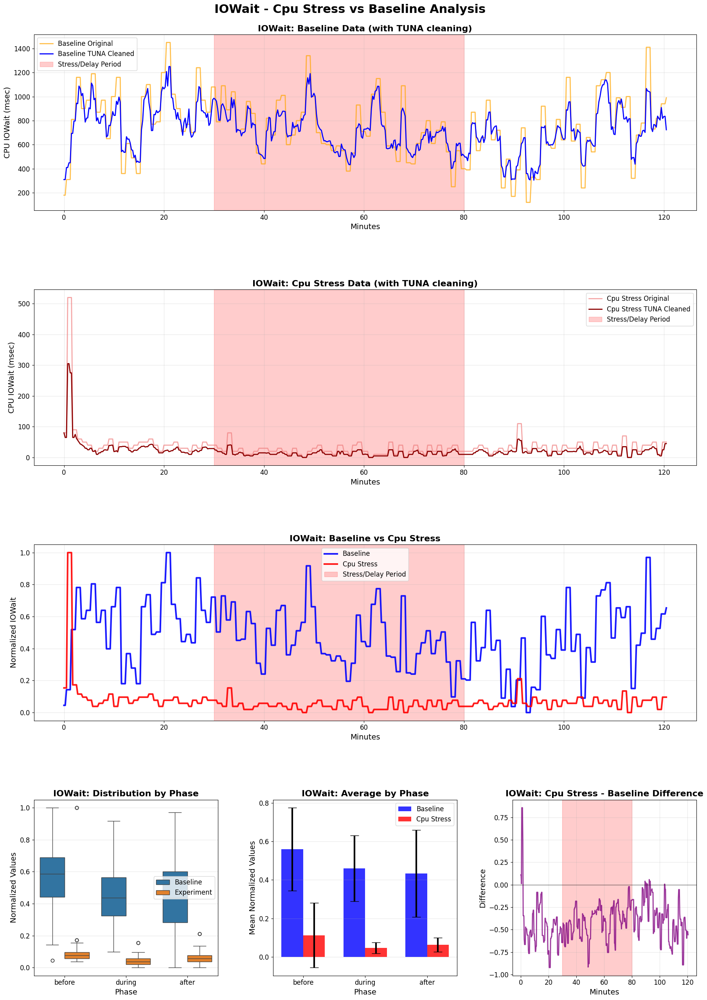


IOWAIT - CPU STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  CPU STRESS: 2121 outliers removed
    Noise Reduction: 42.6%, Correlation: 0.986
  BASELINE: 2099 outliers removed
    Noise Reduction: 30.8%, Correlation: 0.949

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.4336  0.2257  0.0000  0.9699
before  0.5596  0.2150  0.0451  1.0000
during  0.4589  0.1706  0.0977  0.9173

CPU STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0637  0.0364  0.0000  0.2115
before  0.1128  0.1682  0.0385  1.0000
during  0.0465  0.0290  0.0000  0.1538

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 17.93, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 33.78, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= 20.59, p=  0.0000 (SIGNIFICANT)

CPU STRESS IMPACT:
  BEFORE  :  -79.84% (DECREASE)
  DURING  :  -89.87% (DECREASE)
  AFTER   :  -85.30% (DECREASE)

📊 Comparing IOWait: delay

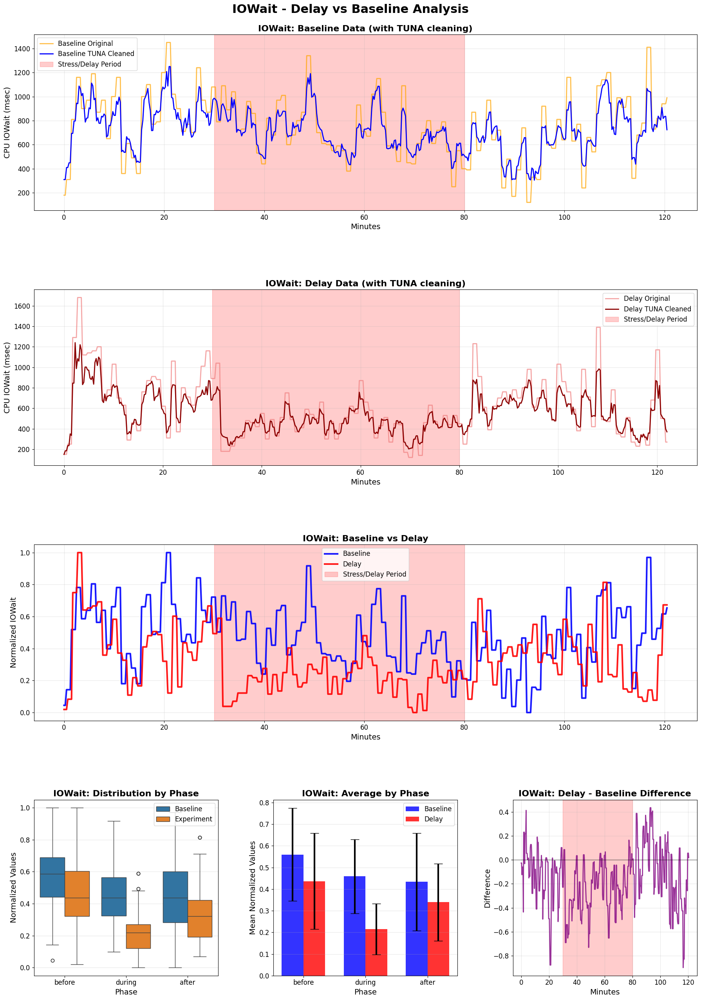


IOWAIT - DELAY VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  DELAY: 2164 outliers removed
    Noise Reduction: 35.1%, Correlation: 0.959
  BASELINE: 2099 outliers removed
    Noise Reduction: 30.8%, Correlation: 0.949

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.4336  0.2257  0.0000  0.9699
before  0.5596  0.2150  0.0451  1.0000
during  0.4589  0.1706  0.0977  0.9173

DELAY STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.3393  0.1778  0.0705  0.8141
before  0.4364  0.2218  0.0192  1.0000
during  0.2154  0.1178  0.0000  0.5897

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  4.37, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 16.65, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=  4.18, p=  0.0000 (SIGNIFICANT)

DELAY IMPACT:
  BEFORE  :  -22.02% (DECREASE)
  DURING  :  -53.07% (DECREASE)
  AFTER   :  -21.76% (DECREASE)

📊 Comparing IOWait: mem_stress stress vs base

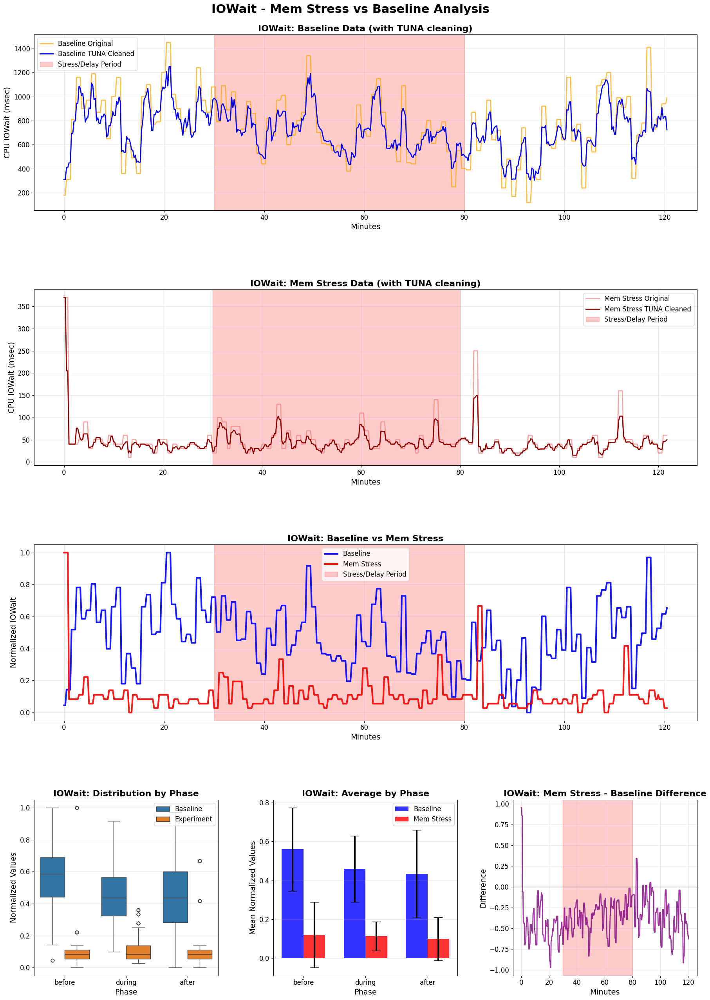


IOWAIT - MEM STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  MEM STRESS: 2327 outliers removed
    Noise Reduction: 29.3%, Correlation: 0.937
  BASELINE: 2099 outliers removed
    Noise Reduction: 30.8%, Correlation: 0.949

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.4336  0.2257  0.0000  0.9699
before  0.5596  0.2150  0.0451  1.0000
during  0.4589  0.1706  0.0977  0.9173

MEM STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0979  0.1112  0.0000  0.6667
before  0.1192  0.1690  0.0000  1.0000
during  0.1128  0.0750  0.0278  0.3611

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 17.64, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 26.33, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= 16.98, p=  0.0000 (SIGNIFICANT)

MEM STRESS IMPACT:
  BEFORE  :  -78.70% (DECREASE)
  DURING  :  -75.43% (DECREASE)
  AFTER   :  -77.42% (DECREASE)

📊 Comparing IOWait: net_l

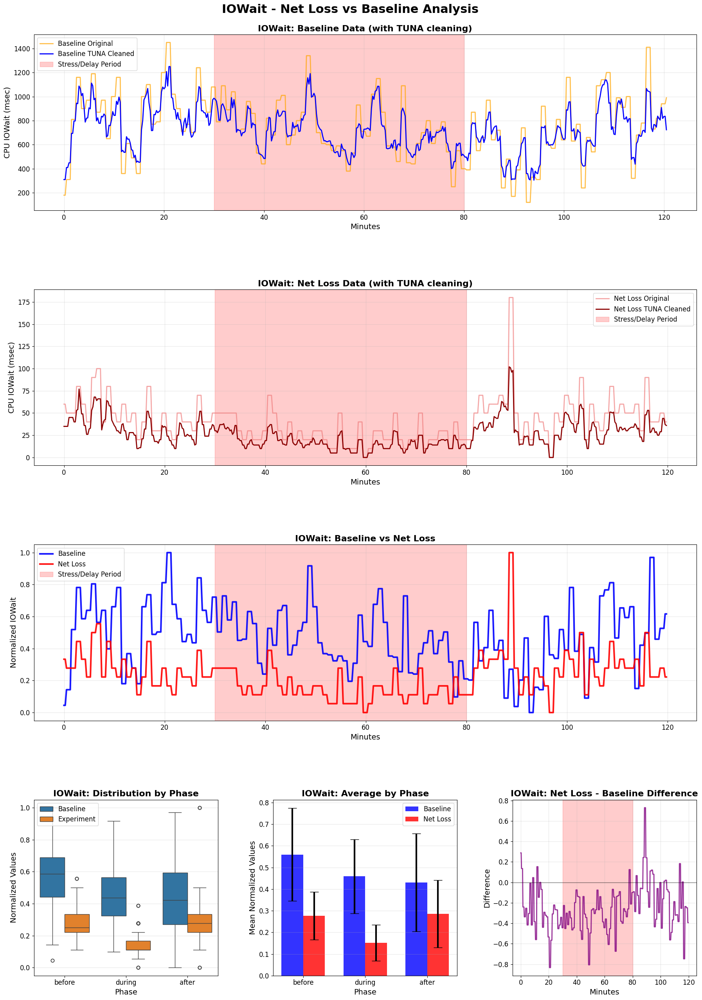


IOWAIT - NET LOSS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  NET LOSS: 1800 outliers removed
    Noise Reduction: 34.7%, Correlation: 0.941
  BASELINE: 2099 outliers removed
    Noise Reduction: 30.8%, Correlation: 0.949

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.4299  0.2262  0.0000  0.9699
before  0.5596  0.2150  0.0451  1.0000
during  0.4589  0.1706  0.0977  0.9173

NET LOSS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2858  0.1559  0.0000  1.0000
before  0.2769  0.1104  0.1111  0.5556
during  0.1515  0.0828  0.0000  0.3889

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 12.82, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 22.98, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=  6.62, p=  0.0000 (SIGNIFICANT)

NET LOSS IMPACT:
  BEFORE  :  -50.53% (DECREASE)
  DURING  :  -66.99% (DECREASE)
  AFTER   :  -33.52% (DECREASE)

🔍 Analyzing IRQ...

📊 Comparing I

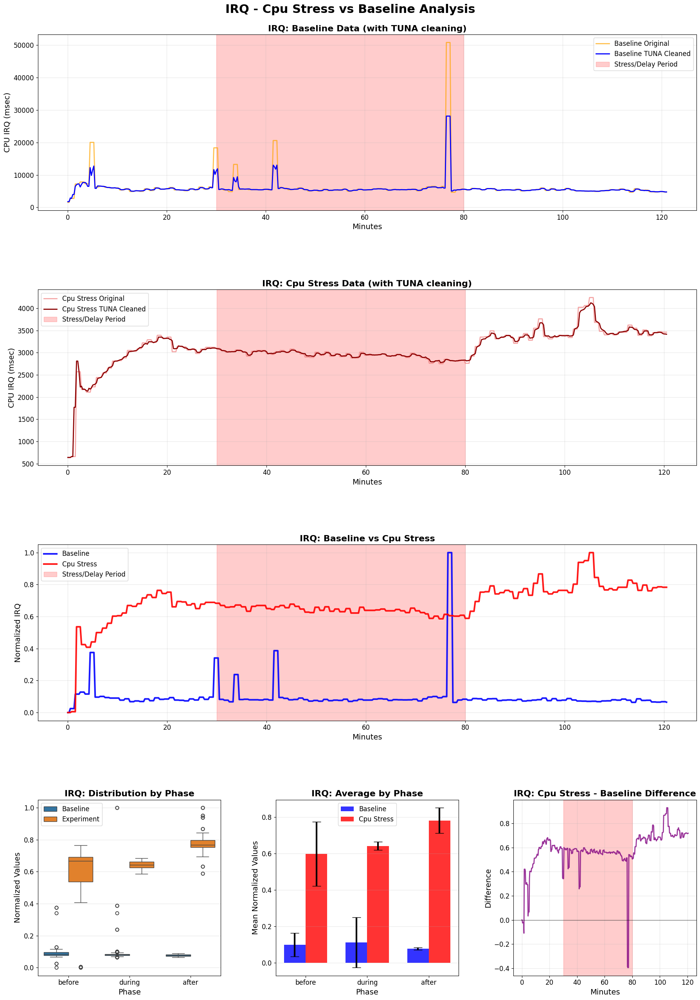


IRQ - CPU STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  CPU STRESS: 28 outliers removed
    Noise Reduction: 6.6%, Correlation: 0.980
  BASELINE: 299 outliers removed
    Noise Reduction: 50.5%, Correlation: 0.991

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0770  0.0067  0.0638  0.0902
before  0.0984  0.0648  0.0000  0.3754
during  0.1110  0.1381  0.0634  1.0000

CPU STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.7807  0.0703  0.5889  1.0000
before  0.5971  0.1768  0.0000  0.7639
during  0.6410  0.0230  0.5861  0.6833

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=-29.02, p=  0.0000 (SIGNIFICANT)
  DURING  : t=-53.66, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=-126.91, p=  0.0000 (SIGNIFICANT)

CPU STRESS IMPACT:
  BEFORE  : +506.96% (INCREASE)
  DURING  : +477.58% (INCREASE)
  AFTER   : +913.45% (INCREASE)

📊 Comparing IRQ: delay stress v

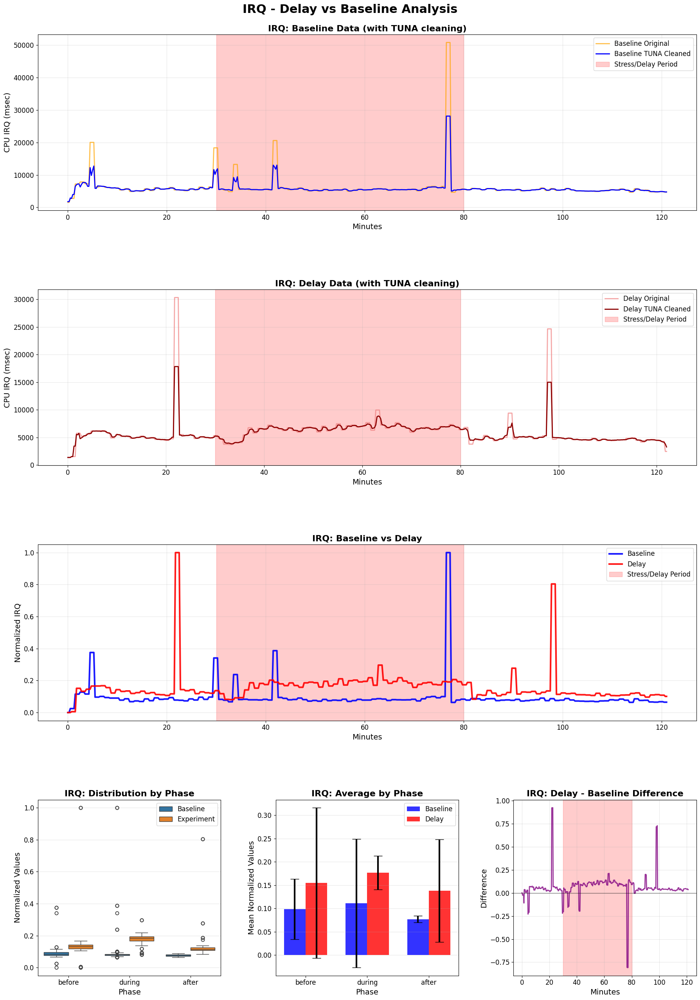


IRQ - DELAY VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  DELAY: 192 outliers removed
    Noise Reduction: 42.3%, Correlation: 0.957
  BASELINE: 299 outliers removed
    Noise Reduction: 50.5%, Correlation: 0.991

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0769  0.0068  0.0638  0.0902
before  0.0984  0.0648  0.0000  0.3754
during  0.1110  0.1381  0.0634  1.0000

DELAY STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.1379  0.1097  0.0833  0.8040
before  0.1547  0.1614  0.0000  1.0000
during  0.1767  0.0363  0.0809  0.2966

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= -3.55, p=  0.0005 (SIGNIFICANT)
  DURING  : t= -6.52, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= -7.11, p=  0.0000 (SIGNIFICANT)

DELAY IMPACT:
  BEFORE  :  +57.26% (INCREASE)
  DURING  :  +59.22% (INCREASE)
  AFTER   :  +79.38% (INCREASE)

📊 Comparing IRQ: mem_stress stress vs baseline


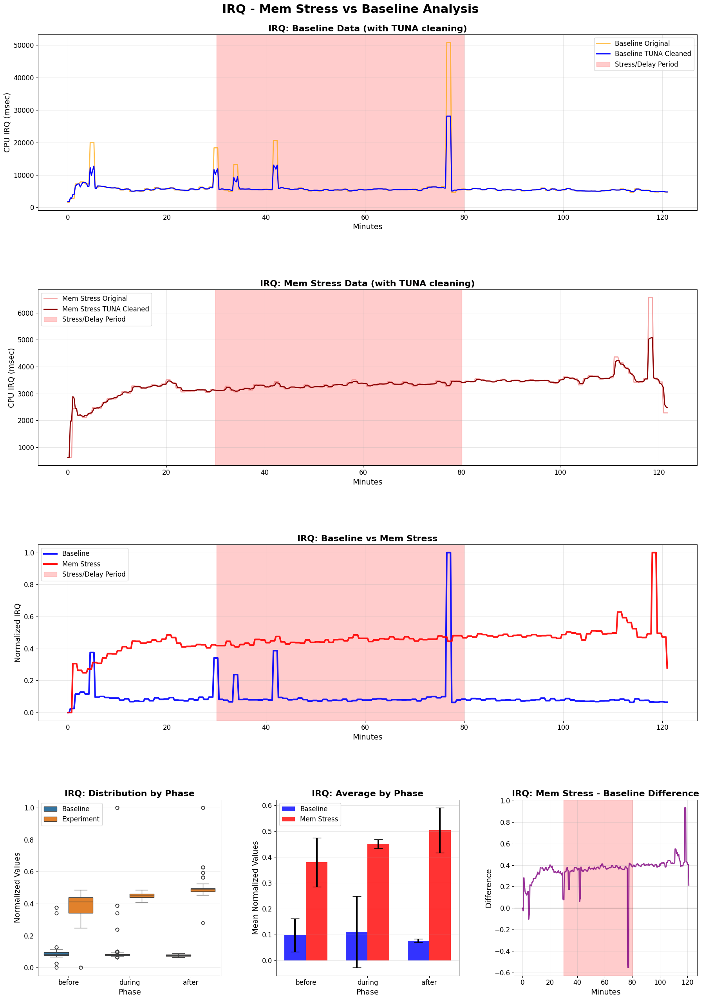


IRQ - MEM STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  MEM STRESS: 39 outliers removed
    Noise Reduction: 21.8%, Correlation: 0.950
  BASELINE: 299 outliers removed
    Noise Reduction: 50.5%, Correlation: 0.991

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0769  0.0068  0.0638  0.0902
before  0.0984  0.0648  0.0000  0.3754
during  0.1110  0.1381  0.0634  1.0000

MEM STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.5043  0.0867  0.2790  1.0000
before  0.3803  0.0948  0.0000  0.4857
during  0.4511  0.0177  0.4101  0.4857

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=-26.89, p=  0.0000 (SIGNIFICANT)
  DURING  : t=-34.62, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=-62.94, p=  0.0000 (SIGNIFICANT)

MEM STRESS IMPACT:
  BEFORE  : +286.64% (INCREASE)
  DURING  : +306.42% (INCREASE)
  AFTER   : +555.93% (INCREASE)

📊 Comparing IRQ: net_loss stres

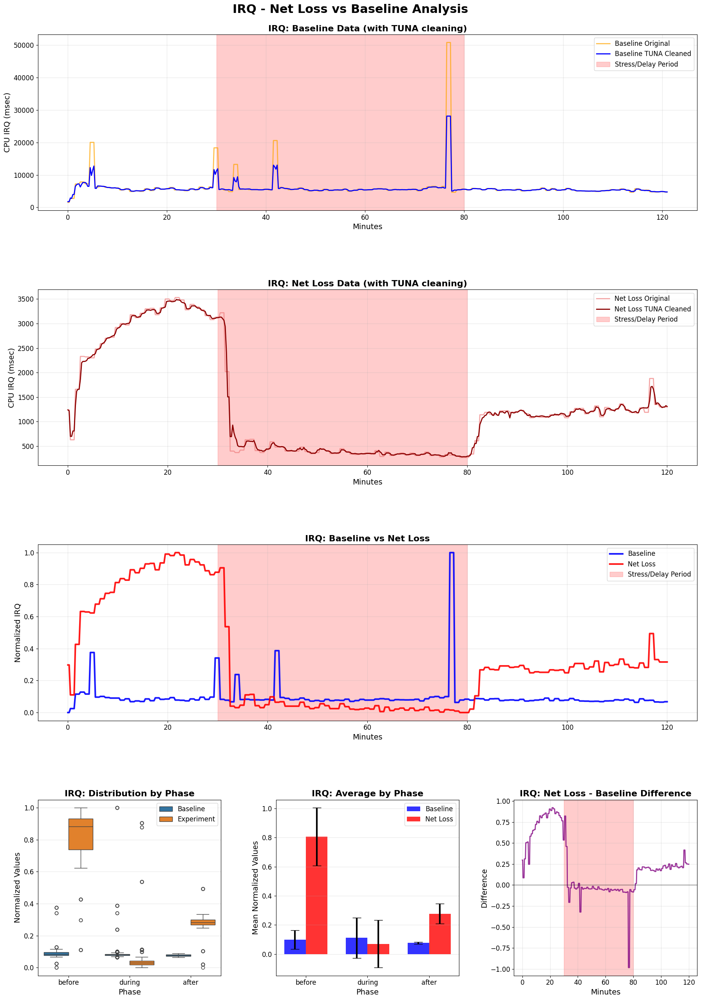


IRQ - NET LOSS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  NET LOSS: 127 outliers removed
    Noise Reduction: 1.2%, Correlation: 0.997
  BASELINE: 299 outliers removed
    Noise Reduction: 50.5%, Correlation: 0.991

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.0772  0.0066  0.0638  0.0902
before  0.0984  0.0648  0.0000  0.3754
during  0.1110  0.1381  0.0634  1.0000

NET LOSS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2772  0.0679  0.0000  0.4939
before  0.8061  0.1990  0.1104  1.0000
during  0.0701  0.1631  0.0000  0.9049

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=-37.04, p=  0.0000 (SIGNIFICANT)
  DURING  : t=  2.71, p=  0.0070 (SIGNIFICANT)
  AFTER   : t=-37.08, p=  0.0000 (SIGNIFICANT)

NET LOSS IMPACT:
  BEFORE  : +719.45% (INCREASE)
  DURING  :  -36.80% (DECREASE)
  AFTER   : +259.26% (INCREASE)

🔍 Analyzing System...

📊 Comparing Syst

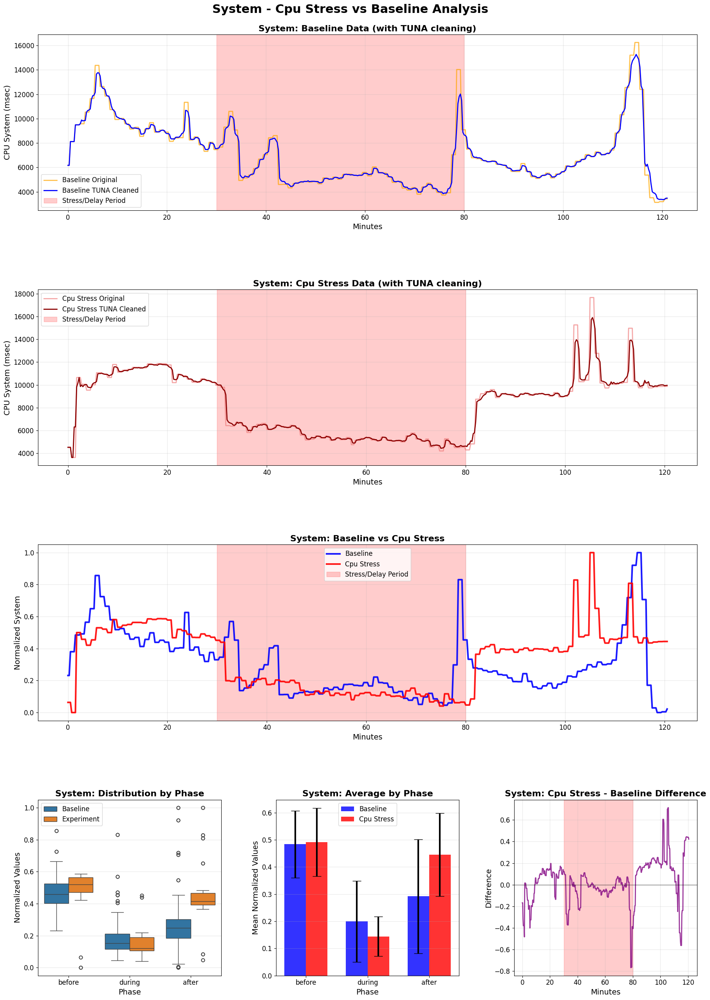


SYSTEM - CPU STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  CPU STRESS: 37 outliers removed
    Noise Reduction: 5.0%, Correlation: 0.980
  BASELINE: 33 outliers removed
    Noise Reduction: 6.6%, Correlation: 0.979

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2917  0.2104  0.0000  1.0000
before  0.4837  0.1235  0.2317  0.8567
during  0.1997  0.1492  0.0457  0.8308

CPU STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.4454  0.1528  0.0471  1.0000
before  0.4916  0.1253  0.0000  0.5870
during  0.1445  0.0733  0.0407  0.4515

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= -0.49, p=  0.6229 (NOT SIGNIFICANT)
  DURING  : t=  4.71, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= -7.52, p=  0.0000 (SIGNIFICANT)

CPU STRESS IMPACT:
  BEFORE  :   +1.63% (INCREASE)
  DURING  :  -27.63% (DECREASE)
  AFTER   :  +52.69% (INCREASE)

📊 Comparing System: delay s

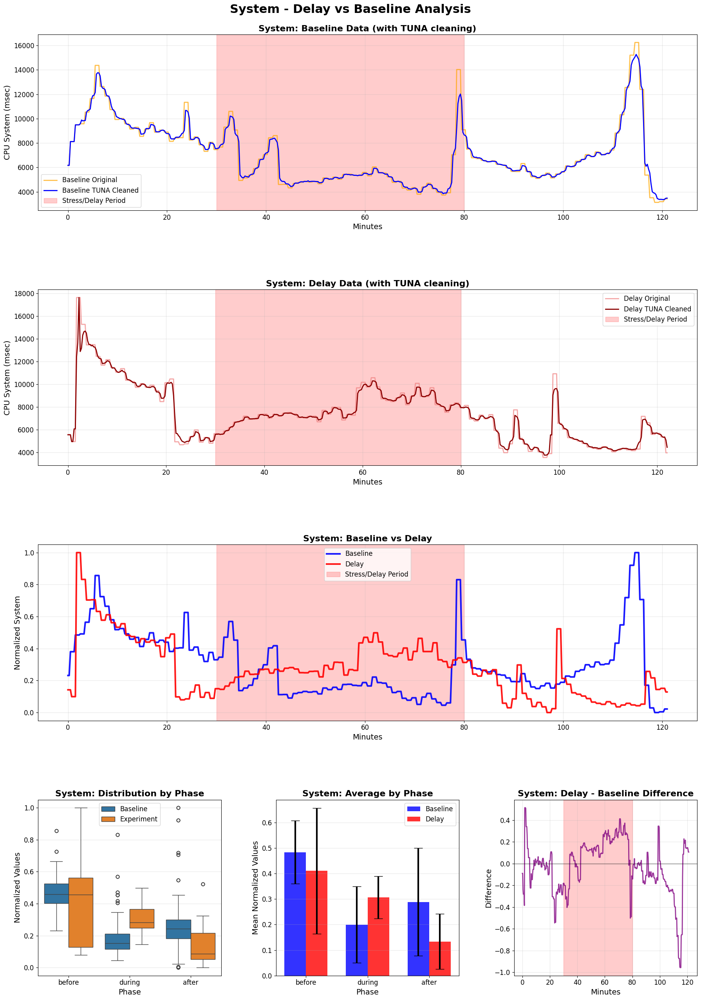


SYSTEM - DELAY VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  DELAY: 69 outliers removed
    Noise Reduction: 7.5%, Correlation: 0.978
  BASELINE: 33 outliers removed
    Noise Reduction: 6.6%, Correlation: 0.979

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2884  0.2112  0.0000  1.0000
before  0.4837  0.1235  0.2317  0.8567
during  0.1997  0.1492  0.0457  0.8308

DELAY STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.1338  0.1088  0.0000  0.5234
before  0.4101  0.2463  0.0795  1.0000
during  0.3065  0.0830  0.1449  0.4986

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  2.92, p=  0.0038 (SIGNIFICANT)
  DURING  : t= -8.86, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=  8.33, p=  0.0000 (SIGNIFICANT)

DELAY IMPACT:
  BEFORE  :  -15.20% (DECREASE)
  DURING  :  +53.45% (INCREASE)
  AFTER   :  -53.61% (DECREASE)

📊 Comparing System: mem_stress stress vs baseline


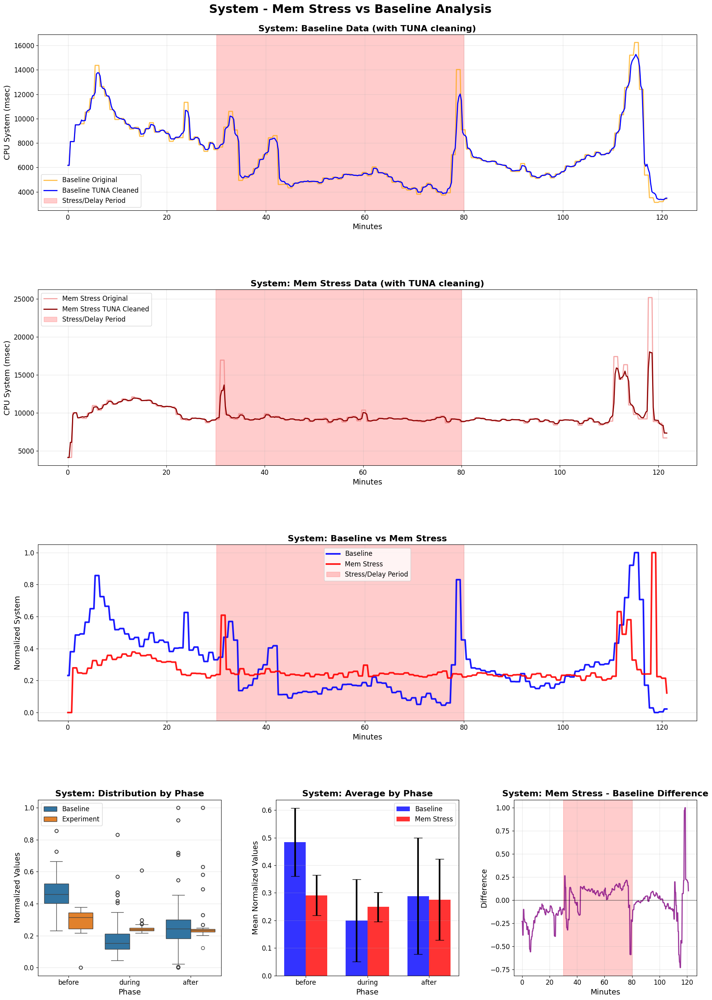


SYSTEM - MEM STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  MEM STRESS: 63 outliers removed
    Noise Reduction: 30.3%, Correlation: 0.933
  BASELINE: 33 outliers removed
    Noise Reduction: 6.6%, Correlation: 0.979

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2884  0.2112  0.0000  1.0000
before  0.4837  0.1235  0.2317  0.8567
during  0.1997  0.1492  0.0457  0.8308

MEM STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2752  0.1469  0.1220  1.0000
before  0.2913  0.0734  0.0000  0.3789
during  0.2489  0.0535  0.2156  0.6087

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 14.67, p=  0.0000 (SIGNIFICANT)
  DURING  : t= -4.40, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=  0.66, p=  0.5118 (NOT SIGNIFICANT)

MEM STRESS IMPACT:
  BEFORE  :  -39.78% (DECREASE)
  DURING  :  +24.64% (INCREASE)
  AFTER   :   -4.58% (DECREASE)

📊 Comparing System: net_lo

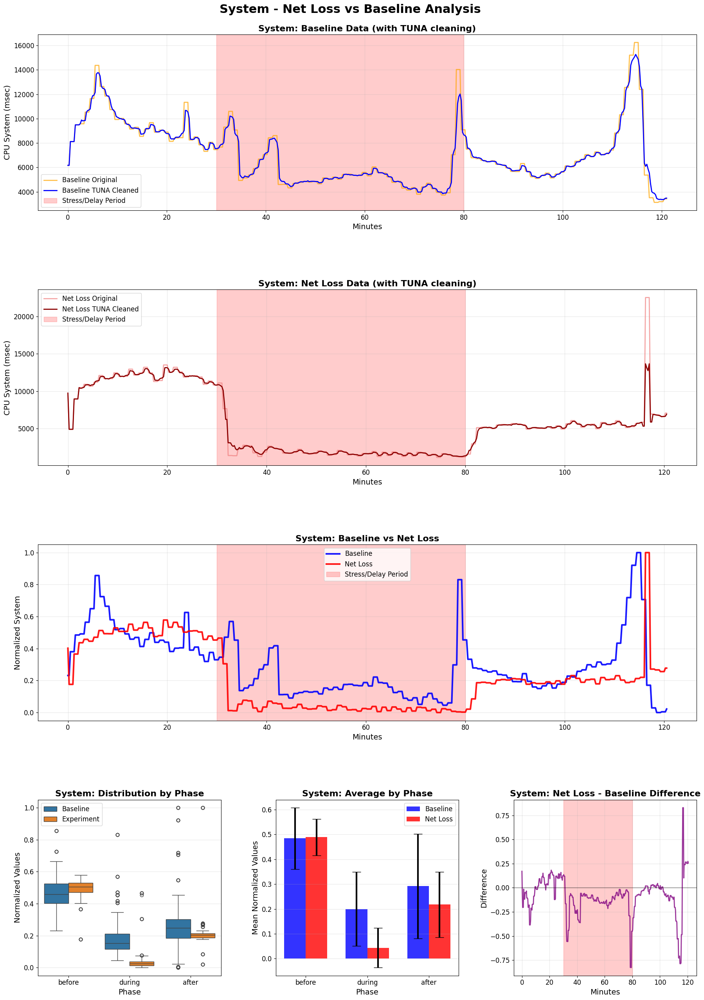


SYSTEM - NET LOSS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  NET LOSS: 111 outliers removed
    Noise Reduction: 6.3%, Correlation: 0.979
  BASELINE: 33 outliers removed
    Noise Reduction: 6.6%, Correlation: 0.979

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2917  0.2104  0.0000  1.0000
before  0.4837  0.1235  0.2317  0.8567
during  0.1997  0.1492  0.0457  0.8308

NET LOSS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.2176  0.1315  0.0211  1.0000
before  0.4885  0.0730  0.1761  0.5785
during  0.0437  0.0797  0.0000  0.4656

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= -0.37, p=  0.7136 (NOT SIGNIFICANT)
  DURING  : t= 13.08, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=  3.80, p=  0.0002 (SIGNIFICANT)

NET LOSS IMPACT:
  BEFORE  :   +1.00% (INCREASE)
  DURING  :  -78.13% (DECREASE)
  AFTER   :  -25.40% (DECREASE)

🔍 Analyzing User...

📊 Comparing U

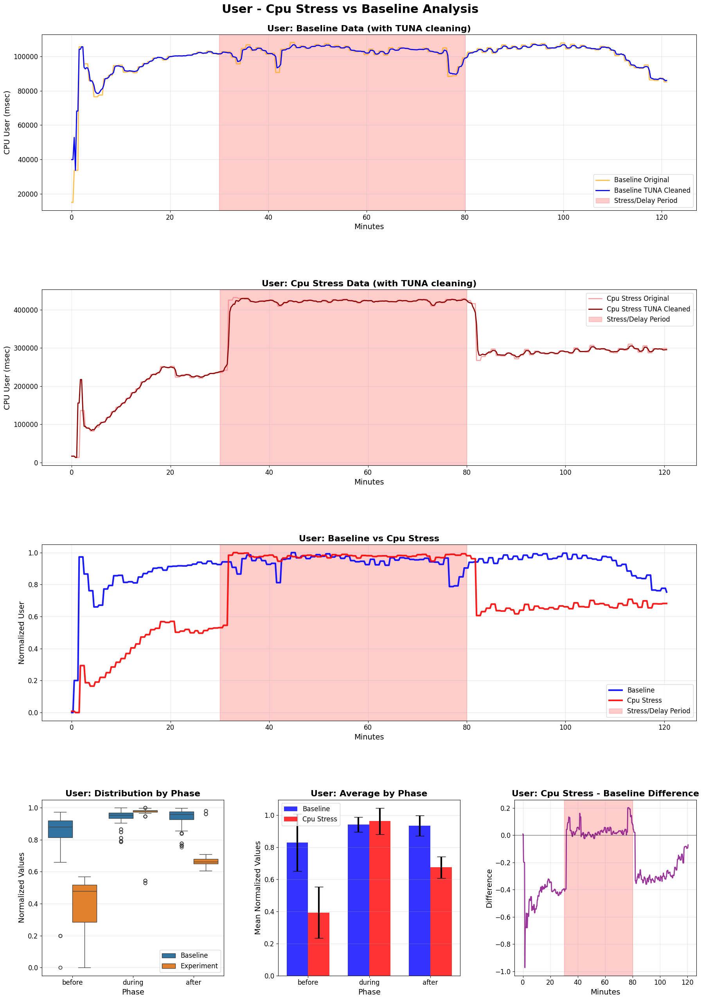


USER - CPU STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  CPU STRESS: 32 outliers removed
    Noise Reduction: 2.3%, Correlation: 0.992
  BASELINE: 45 outliers removed
    Noise Reduction: 20.1%, Correlation: 0.966

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9346  0.0639  0.7534  0.9967
before  0.8292  0.1782  0.0000  0.9729
during  0.9422  0.0461  0.7877  1.0000

CPU STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.6751  0.0664  0.6065  0.9809
before  0.3940  0.1599  0.0000  0.5700
during  0.9637  0.0815  0.5307  1.0000

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 19.91, p=  0.0000 (SIGNIFICANT)
  DURING  : t= -3.26, p=  0.0012 (SIGNIFICANT)
  AFTER   : t= 35.84, p=  0.0000 (SIGNIFICANT)

CPU STRESS IMPACT:
  BEFORE  :  -52.49% (DECREASE)
  DURING  :   +2.29% (INCREASE)
  AFTER   :  -27.77% (DECREASE)

📊 Comparing User: delay stress v

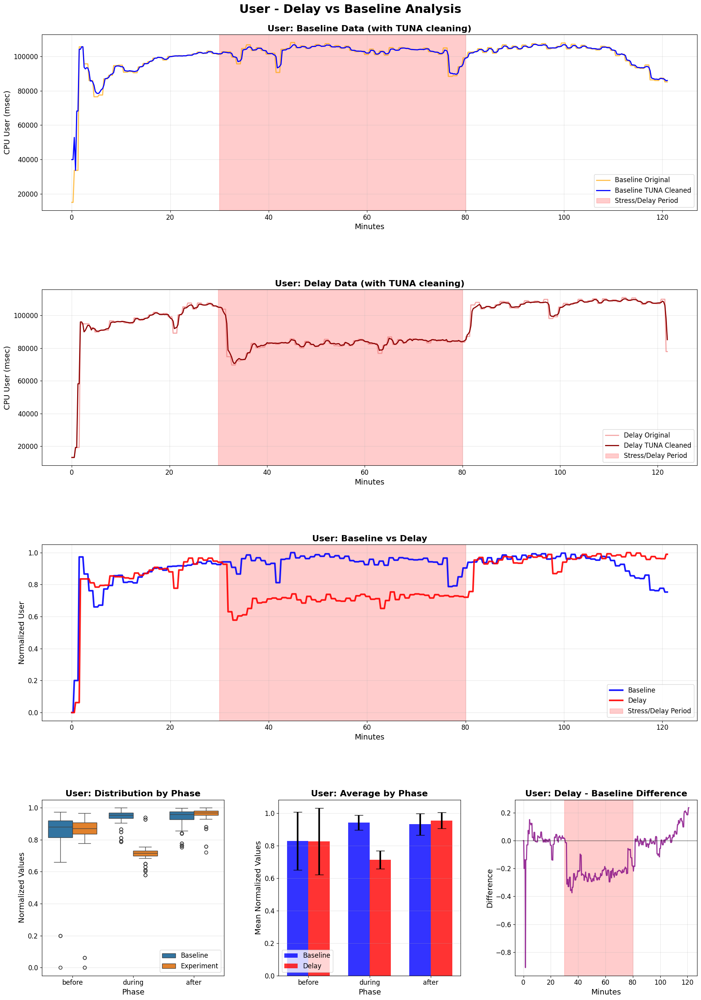


USER - DELAY VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  DELAY: 38 outliers removed
    Noise Reduction: 6.4%, Correlation: 0.979
  BASELINE: 45 outliers removed
    Noise Reduction: 20.1%, Correlation: 0.966

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9324  0.0665  0.7534  0.9967
before  0.8292  0.1782  0.0000  0.9729
during  0.9422  0.0461  0.7877  1.0000

DELAY STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9556  0.0493  0.7209  1.0000
before  0.8267  0.2053  0.0000  0.9660
during  0.7138  0.0552  0.5778  0.9399

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  0.10, p=  0.9194 (NOT SIGNIFICANT)
  DURING  : t= 45.01, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= -3.58, p=  0.0004 (SIGNIFICANT)

DELAY IMPACT:
  BEFORE  :   -0.30% (DECREASE)
  DURING  :  -24.24% (DECREASE)
  AFTER   :   +2.49% (INCREASE)

📊 Comparing User: mem_stress stress vs baseline


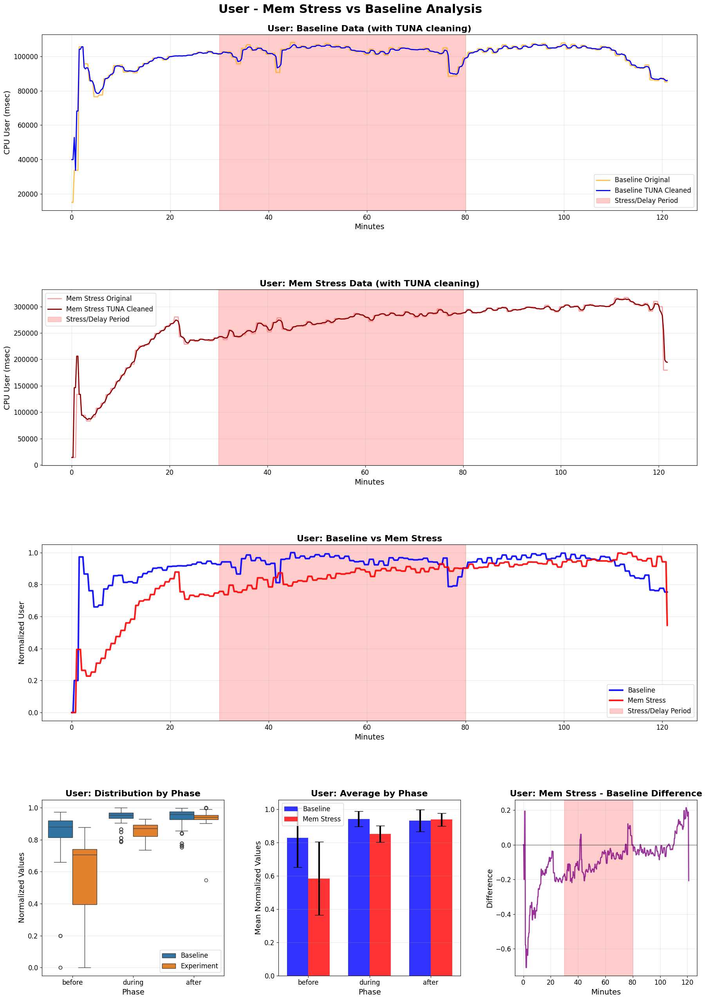


USER - MEM STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  MEM STRESS: 32 outliers removed
    Noise Reduction: 5.1%, Correlation: 0.981
  BASELINE: 45 outliers removed
    Noise Reduction: 20.1%, Correlation: 0.966

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9324  0.0665  0.7534  0.9967
before  0.8292  0.1782  0.0000  0.9729
during  0.9422  0.0461  0.7877  1.0000

MEM STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9389  0.0389  0.5459  1.0000
before  0.5845  0.2212  0.0000  0.8786
during  0.8523  0.0494  0.7367  0.9296

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  9.43, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 18.86, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= -1.08, p=  0.2828 (NOT SIGNIFICANT)

MEM STRESS IMPACT:
  BEFORE  :  -29.50% (DECREASE)
  DURING  :   -9.54% (DECREASE)
  AFTER   :   +0.69% (INCREASE)

📊 Comparing User: net_loss s

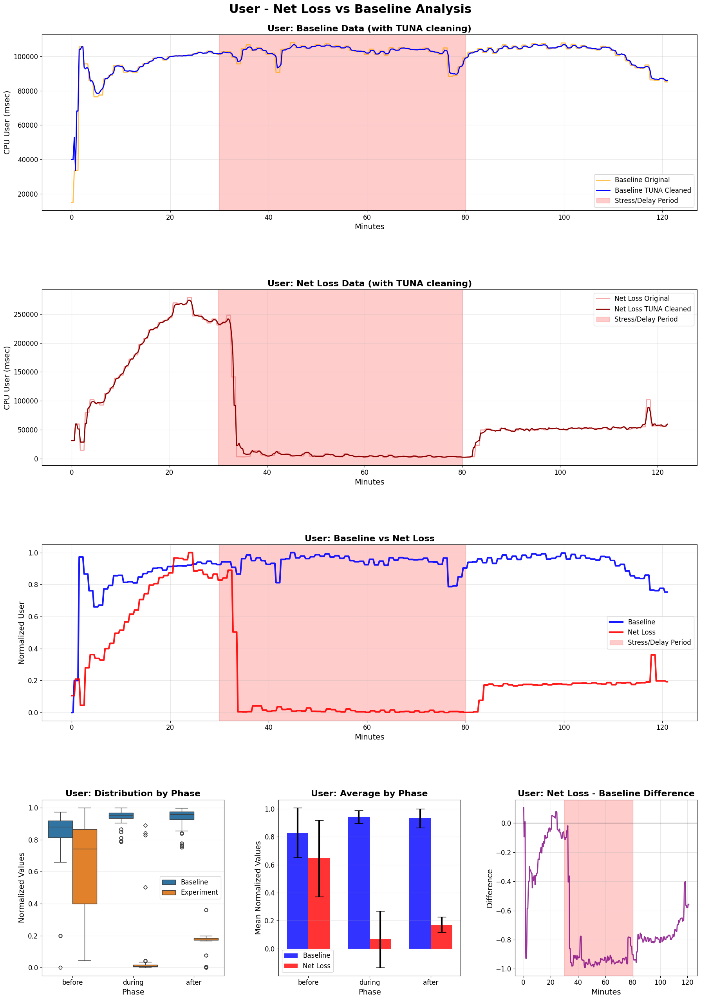


USER - NET LOSS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  NET LOSS: 216 outliers removed
    Noise Reduction: 0.8%, Correlation: 0.997
  BASELINE: 45 outliers removed
    Noise Reduction: 20.1%, Correlation: 0.966

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9324  0.0665  0.7534  0.9967
before  0.8292  0.1782  0.0000  0.9729
during  0.9422  0.0461  0.7877  1.0000

NET LOSS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.1707  0.0545  0.0007  0.3608
before  0.6458  0.2729  0.0453  1.0000
during  0.0668  0.2027  0.0000  0.8900

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  6.16, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 59.71, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=113.41, p=  0.0000 (SIGNIFICANT)

NET LOSS IMPACT:
  BEFORE  :  -22.11% (DECREASE)
  DURING  :  -92.91% (DECREASE)
  AFTER   :  -81.69% (DECREASE)

🔍 Analyzing Utilization...

📊 Comparing

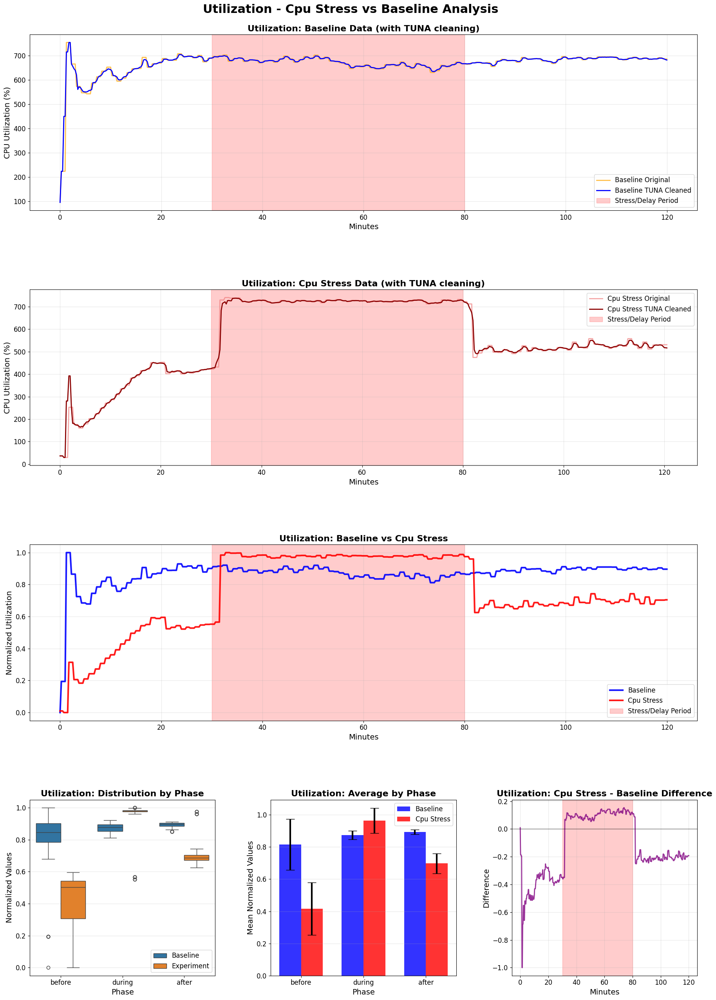


UTILIZATION - CPU STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  CPU STRESS: 32 outliers removed
    Noise Reduction: 2.5%, Correlation: 0.991
  BASELINE: 32 outliers removed
    Noise Reduction: 11.8%, Correlation: 0.964

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.8925  0.0145  0.8499  0.9118
before  0.8153  0.1576  0.0000  1.0000
during  0.8744  0.0265  0.8122  0.9214

CPU STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.6982  0.0624  0.6253  0.9750
before  0.4159  0.1641  0.0000  0.5951
during  0.9645  0.0775  0.5525  1.0000

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= 19.23, p=  0.0000 (SIGNIFICANT)
  DURING  : t=-15.61, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= 38.39, p=  0.0000 (SIGNIFICANT)

CPU STRESS IMPACT:
  BEFORE  :  -48.99% (DECREASE)
  DURING  :  +10.31% (INCREASE)
  AFTER   :  -21.77% (DECREASE)

📊 Comparing Utilization: 

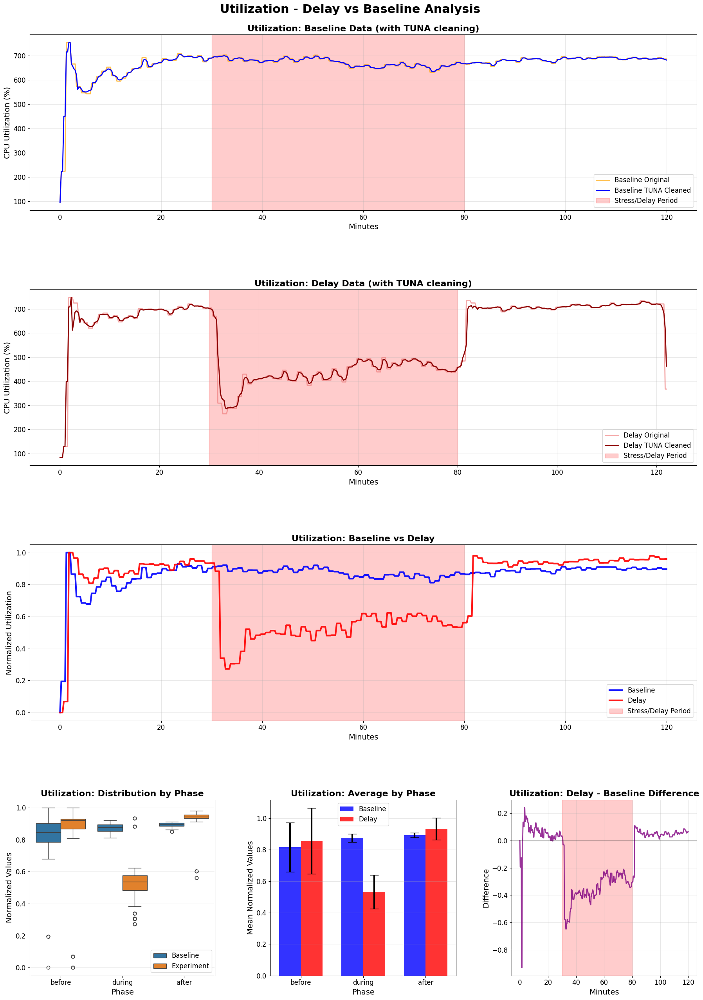


UTILIZATION - DELAY VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  DELAY: 53 outliers removed
    Noise Reduction: 4.3%, Correlation: 0.983
  BASELINE: 32 outliers removed
    Noise Reduction: 11.8%, Correlation: 0.964

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.8925  0.0145  0.8499  0.9118
before  0.8153  0.1576  0.0000  1.0000
during  0.8744  0.0265  0.8122  0.9214

DELAY STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9331  0.0698  0.5622  0.9803
before  0.8561  0.2086  0.0000  1.0000
during  0.5322  0.1080  0.2728  0.9348

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t= -1.71, p=  0.0887 (NOT SIGNIFICANT)
  DURING  : t= 43.63, p=  0.0000 (SIGNIFICANT)
  AFTER   : t= -7.21, p=  0.0000 (SIGNIFICANT)

DELAY IMPACT:
  BEFORE  :   +5.00% (INCREASE)
  DURING  :  -39.13% (DECREASE)
  AFTER   :   +4.55% (INCREASE)

📊 Comparing Utilization: mem_stress stres

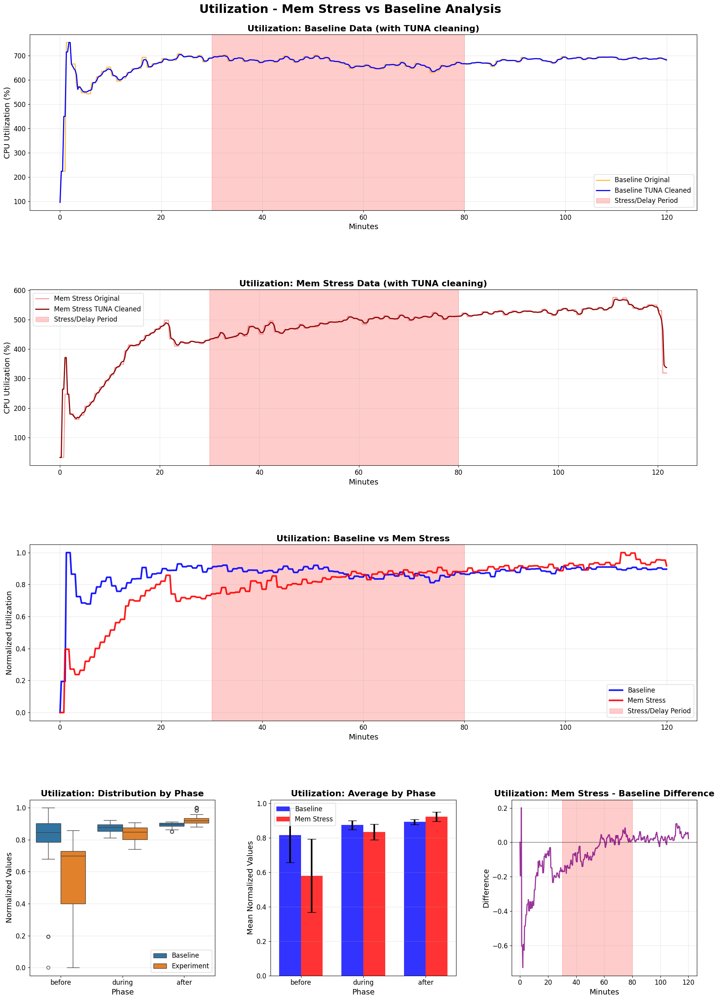


UTILIZATION - MEM STRESS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  MEM STRESS: 32 outliers removed
    Noise Reduction: 5.3%, Correlation: 0.980
  BASELINE: 32 outliers removed
    Noise Reduction: 11.8%, Correlation: 0.964

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.8925  0.0145  0.8499  0.9118
before  0.8153  0.1576  0.0000  1.0000
during  0.8744  0.0265  0.8122  0.9214

MEM STRESS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.9225  0.0277  0.8800  1.0000
before  0.5800  0.2127  0.0000  0.8583
during  0.8344  0.0460  0.7408  0.9074

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  9.74, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 10.68, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=-12.17, p=  0.0000 (SIGNIFICANT)

MEM STRESS IMPACT:
  BEFORE  :  -28.86% (DECREASE)
  DURING  :   -4.57% (DECREASE)
  AFTER   :   +3.37% (INCREASE)

📊 Comparing Utilization: 

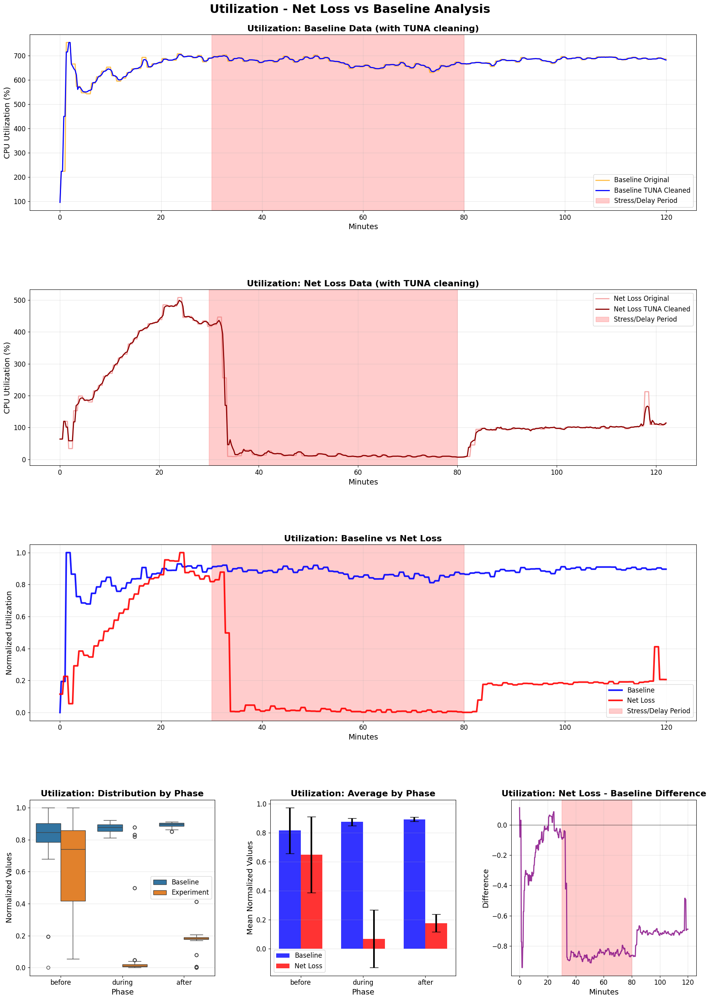


UTILIZATION - NET LOSS VS BASELINE ANALYSIS

TUNA CLEANING SUMMARY:
  NET LOSS: 202 outliers removed
    Noise Reduction: 0.8%, Correlation: 0.997
  BASELINE: 32 outliers removed
    Noise Reduction: 11.8%, Correlation: 0.964

BASELINE STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.8925  0.0145  0.8499  0.9118
before  0.8153  0.1576  0.0000  1.0000
during  0.8744  0.0265  0.8122  0.9214

NET LOSS STATISTICS BY PHASE:
          mean     std     min     max
phase                                 
after   0.1760  0.0603  0.0010  0.4113
before  0.6481  0.2628  0.0555  1.0000
during  0.0679  0.1996  0.0000  0.8780

STATISTICAL SIGNIFICANCE TESTS:
  BEFORE  : t=  5.98, p=  0.0000 (SIGNIFICANT)
  DURING  : t= 56.78, p=  0.0000 (SIGNIFICANT)
  AFTER   : t=146.13, p=  0.0000 (SIGNIFICANT)

NET LOSS IMPACT:
  BEFORE  :  -20.51% (DECREASE)
  DURING  :  -92.23% (DECREASE)
  AFTER   :  -80.27% (DECREASE)


In [10]:
def calculate_cumulative_cpu(df):
    """Calculate total CPU from all CPU columns"""
    exclude_cols = ['Time', 'Minutes', 'source']
    cpu_cols = [col for col in df.columns if col not in exclude_cols]
    return df[cpu_cols].sum(axis=1).values

def normalize_series(series):
    """Normalize a series to 0-1 range"""
    min_val = series.min()
    max_val = series.max()
    if max_val > min_val:
        return (series - min_val) / (max_val - min_val)
    else:
        return pd.Series(np.zeros(len(series)), index=series.index)

def add_phase_column(df, delay_minutes=30, duration_minutes=50):
    """Add phase column based on experiment timeline"""
    df = df.copy()
    df['phase'] = 'before'
    df.loc[(df['Minutes'] >= delay_minutes) & (df['Minutes'] <= delay_minutes + duration_minutes), 'phase'] = 'during'
    df.loc[df['Minutes'] > delay_minutes + duration_minutes, 'phase'] = 'after'
    return df

def get_y_axis_label(metric_name):
    """Get appropriate y-axis label based on metric name"""
    labels = {
        'IOWait': 'CPU IOWait (msec)',
        'IRQ': 'CPU IRQ (msec)',
        'System': 'CPU System (msec)', 
        'User': 'CPU User (msec)',
        'Utilization': 'CPU Utilization (%)'
    }
    return labels.get(metric_name, 'Value')

def analyze_and_plot_metric_comparison(metric_name, experiment_name, experiment_df, baseline_df, 
                                     tuna_results=None, delay_minutes=30, duration_minutes=50):
    """
    Create 6-plot comparison analysis for a specific metric between experiment and baseline
    
    Parameters:
    - metric_name: Name of the metric (e.g., 'IOWait', 'IRQ', 'System', 'User', 'Utilization')
    - experiment_name: Name of the experiment (e.g., 'cpu_stress', 'delay', 'mem_stress', 'net_loss')
    - experiment_df: DataFrame containing experiment data
    - baseline_df: DataFrame containing baseline data
    - tuna_results: Optional TUNA results for cleaned data comparison
    - delay_minutes: When the stress/delay starts (default 30)
    - duration_minutes: How long the stress/delay lasts (default 50)
    """
    
    # Calculate cumulative metrics
    experiment_cumulative = calculate_cumulative_cpu(experiment_df)
    baseline_cumulative = calculate_cumulative_cpu(baseline_df)
    
    # Create series with proper index
    experiment_series = pd.Series(experiment_cumulative, index=experiment_df.index)
    baseline_series = pd.Series(baseline_cumulative, index=baseline_df.index)
    
    # Get TUNA cleaned data if available
    experiment_cleaned = None
    baseline_cleaned = None
    if tuna_results and metric_name in tuna_results:
        if experiment_name in tuna_results[metric_name]:
            experiment_cleaned = pd.Series(tuna_results[metric_name][experiment_name]['cleaned'])
        if 'baseline' in tuna_results[metric_name]:
            baseline_cleaned = pd.Series(tuna_results[metric_name]['baseline']['cleaned'])
    
    # Normalize data
    experiment_norm = normalize_series(experiment_series)
    baseline_norm = normalize_series(baseline_series)
    
    # Create combined dataframe for analysis
    min_length = min(len(experiment_norm), len(baseline_norm), len(experiment_df['Minutes']), len(baseline_df['Minutes']))
    
    df_combined = pd.DataFrame({
        'Baseline': baseline_norm.iloc[:min_length],
        'Experiment': experiment_norm.iloc[:min_length],
        'Minutes': experiment_df['Minutes'].iloc[:min_length],
        'Baseline_Minutes': baseline_df['Minutes'].iloc[:min_length]
    })
    
    df_combined['difference'] = df_combined['Experiment'] - df_combined['Baseline']
    
    # Add phase information
    df_combined['phase'] = 'before'
    df_combined.loc[(df_combined['Minutes'] >= delay_minutes) & 
                   (df_combined['Minutes'] <= delay_minutes + duration_minutes), 'phase'] = 'during'
    df_combined.loc[df_combined['Minutes'] > delay_minutes + duration_minutes, 'phase'] = 'after'
    
    # Statistical analysis by phase
    stats_baseline = df_combined.groupby('phase')['Baseline'].agg(['mean', 'std', 'min', 'max'])
    stats_experiment = df_combined.groupby('phase')['Experiment'].agg(['mean', 'std', 'min', 'max'])
    
    # T-tests for statistical significance
    t_tests = {}
    available_phases = stats_baseline.index.tolist()
    
    for phase in ['before', 'during', 'after']:
        if phase in available_phases:
            data = df_combined[df_combined['phase'] == phase]
            if len(data) > 1:
                t_stat, p_value = scipy_stats.ttest_ind(data['Baseline'].dropna(), data['Experiment'].dropna())
                t_tests[phase] = {'t': t_stat, 'p': p_value}
            else:
                t_tests[phase] = {'t': 0, 'p': 1}
        else:
            t_tests[phase] = {'t': 0, 'p': 1, 'note': 'Phase not present in data'}
    
    # Calculate percentage impact
    impact = {}
    for phase in ['before', 'during', 'after']:
        if phase in available_phases:
            baseline_mean = stats_baseline.loc[phase, 'mean']
            experiment_mean = stats_experiment.loc[phase, 'mean']
            if baseline_mean != 0:
                impact[phase] = ((experiment_mean - baseline_mean) / baseline_mean) * 100
            else:
                impact[phase] = 0
        else:
            impact[phase] = 0
    
    # Create the 6-plot visualization with first 3 plots on separate rows, last 3 on bottom row
    fig = plt.figure(figsize=(18, 26))  # Further reduced width, kept height
    
    # 1. Baseline with/without outlier cleaning - FULL WIDTH on Row 1
    plt.subplot(4, 1, 1)  # Full width centered subplot
    plt.plot(baseline_df['Minutes'], baseline_series, 
             label='Baseline Original', color='orange', alpha=0.7, linewidth=2)  # Increased linewidth
    
    if baseline_cleaned is not None:
        plt.plot(baseline_df['Minutes'].iloc[:len(baseline_cleaned)], baseline_cleaned, 
                 label='Baseline TUNA Cleaned', linewidth=2, color='blue')  # Thinner cleaned line
        title_suffix = " (with TUNA cleaning)"
    else:
        plt.plot(baseline_df['Minutes'], baseline_series, 
                 label='Baseline', linewidth=2, color='blue')  # Thinner cleaned line
        title_suffix = ""
    
    plt.axvspan(delay_minutes, delay_minutes + duration_minutes, 
                color='red', alpha=0.2, label="Stress/Delay Period")
    plt.title(f'{metric_name}: Baseline Data{title_suffix}', fontsize=16, fontweight='bold')  # Larger fonts for bigger plots
    plt.xlabel('Minutes', fontsize=14)
    plt.ylabel(get_y_axis_label(metric_name), fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tick_params(axis='both', which='major', labelsize=12)
    
    # 2. Experiment with/without outlier cleaning - FULL WIDTH on Row 2
    plt.subplot(4, 1, 2)  # Full width centered subplot
    plt.plot(experiment_df['Minutes'], experiment_series, 
             label=f'{experiment_name.replace("_", " ").title()} Original', 
             alpha=0.7, color='lightcoral', linewidth=2)  # Increased linewidth
    
    if experiment_cleaned is not None:
        plt.plot(experiment_df['Minutes'].iloc[:len(experiment_cleaned)], experiment_cleaned, 
                 label=f'{experiment_name.replace("_", " ").title()} TUNA Cleaned', 
                 linewidth=2, color='darkred')  # Thinner cleaned line
        title_suffix = " (with TUNA cleaning)"
    else:
        plt.plot(experiment_df['Minutes'], experiment_series, 
                 label=f'{experiment_name.replace("_", " ").title()}', 
                 linewidth=2, color='darkred')  # Thinner cleaned line
        title_suffix = ""
    
    plt.axvspan(delay_minutes, delay_minutes + duration_minutes, 
                color='red', alpha=0.2, label="Stress/Delay Period")
    plt.title(f'{metric_name}: {experiment_name.replace("_", " ").title()} Data{title_suffix}', 
              fontsize=16, fontweight='bold')  # Larger fonts for bigger plots
    plt.xlabel('Minutes', fontsize=14)
    plt.ylabel(get_y_axis_label(metric_name), fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tick_params(axis='both', which='major', labelsize=12)
    
    # 3. Timeline comparison (normalized) - FULL WIDTH on Row 3
    plt.subplot(4, 1, 3)  # Full width centered subplot
    plt.plot(df_combined['Minutes'], df_combined['Baseline'], 
             label='Baseline', linewidth=3, color='blue', alpha=0.9)  # Slightly thinner
    plt.plot(df_combined['Minutes'], df_combined['Experiment'], 
             label=f'{experiment_name.replace("_", " ").title()}', linewidth=3, color='red', alpha=0.9)  # Slightly thinner
    plt.axvspan(delay_minutes, delay_minutes + duration_minutes, 
                color='red', alpha=0.2, label="Stress/Delay Period")
    plt.title(f"{metric_name}: Baseline vs {experiment_name.replace('_', ' ').title()}", 
              fontsize=16, fontweight='bold')  # Larger fonts for bigger plots
    plt.xlabel("Minutes", fontsize=14)
    plt.ylabel(f"Normalized {metric_name}", fontsize=14)
    plt.grid(True, alpha=0.3)
    plt.legend(fontsize=12)
    plt.tick_params(axis='both', which='major', labelsize=12)
    
    # 4. Box plot by phase - Bottom row, first plot
    plt.subplot(4, 3, 10)  # Row 4, column 1
    box_data = pd.melt(df_combined[['Baseline', 'Experiment', 'phase']], 
                      id_vars=['phase'], var_name='source', value_name='value')
    sns.boxplot(x='phase', y='value', hue='source', data=box_data, ax=plt.gca())
    plt.title(f'{metric_name}: Distribution by Phase', fontsize=16, fontweight='bold')  # Larger fonts for bigger plots
    plt.xlabel('Phase', fontsize=14)
    plt.ylabel('Normalized Values', fontsize=14)
    plt.grid(axis='y', alpha=0.3)
    plt.legend(fontsize=12)
    plt.tick_params(axis='both', which='major', labelsize=12)
    
    # 5. Statistics by phase - Bottom row, second plot
    plt.subplot(4, 3, 11)  # Row 4, column 2
    phases_to_plot = [p for p in ['before', 'during', 'after'] if p in available_phases]
    
    if len(phases_to_plot) > 0:
        x = np.arange(len(phases_to_plot))
        width = 0.35
        
        baseline_means = [stats_baseline.loc[p, 'mean'] for p in phases_to_plot]
        baseline_stds = [stats_baseline.loc[p, 'std'] for p in phases_to_plot]
        experiment_means = [stats_experiment.loc[p, 'mean'] for p in phases_to_plot]
        experiment_stds = [stats_experiment.loc[p, 'std'] for p in phases_to_plot]
        
        bars1 = plt.bar(x - width/2, baseline_means, width, 
                       label='Baseline', alpha=0.8, color='blue')
        bars2 = plt.bar(x + width/2, experiment_means, width, 
                       label=f'{experiment_name.replace("_", " ").title()}', alpha=0.8, color='red')
        
        plt.errorbar(x - width/2, baseline_means, yerr=baseline_stds, 
                    fmt='none', ecolor='black', capsize=8, linewidth=3)  # Increased capsize and linewidth
        plt.errorbar(x + width/2, experiment_means, yerr=experiment_stds, 
                    fmt='none', ecolor='black', capsize=8, linewidth=3)  # Increased capsize and linewidth
        
        plt.xticks(x, phases_to_plot)
    else:
        plt.text(0.5, 0.5, 'No phase data available', ha='center', va='center', 
                transform=plt.gca().transAxes, fontsize=14)
    
    plt.title(f'{metric_name}: Average by Phase', fontsize=16, fontweight='bold')  # Larger fonts for bigger plots
    plt.xlabel('Phase', fontsize=14)
    plt.ylabel('Mean Normalized Values', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(axis='y', alpha=0.3)
    plt.tick_params(axis='both', which='major', labelsize=12)
    
    # 6. Difference over time - Bottom row, third plot
    plt.subplot(4, 3, 12)  # Row 4, column 3
    plt.plot(df_combined['Minutes'], df_combined['difference'], 
             color='purple', linewidth=2, alpha=0.8)  # Thinner line
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.5, linewidth=1)  # Thinner reference line
    plt.axvspan(delay_minutes, delay_minutes + duration_minutes, 
                color='red', alpha=0.2)
    plt.title(f'{metric_name}: {experiment_name.replace("_", " ").title()} - Baseline Difference', 
              fontsize=16, fontweight='bold')  # Increased fontsize
    plt.xlabel('Minutes', fontsize=14)  # Increased fontsize
    plt.ylabel('Difference', fontsize=14)  # Increased fontsize
    plt.grid(True, alpha=0.3)
    plt.tick_params(axis='both', which='major', labelsize=12)  # Increased tick label size
    
    plt.suptitle(f'{metric_name} - {experiment_name.replace("_", " ").title()} vs Baseline Analysis', 
                fontsize=22, fontweight='bold', y=0.98)  # Keep large title
    plt.tight_layout()
    plt.subplots_adjust(top=0.95, hspace=0.45, wspace=0.3)  # More vertical spacing for higher plots
    plt.show()
    
    # Print statistical results
    print(f"\n{'='*80}")
    print(f"{metric_name.upper()} - {experiment_name.upper().replace('_', ' ')} VS BASELINE ANALYSIS")
    print(f"{'='*80}")
    
    # Print TUNA cleaning summary if available
    if tuna_results and metric_name in tuna_results:
        print(f"\nTUNA CLEANING SUMMARY:")
        if experiment_name in tuna_results[metric_name]:
            exp_stats = tuna_results[metric_name][experiment_name]['stats']
            print(f"  {experiment_name.upper().replace('_', ' ')}: {exp_stats['outliers']} outliers removed")
            print(f"    Noise Reduction: {exp_stats['noise_reduction']:.1f}%, Correlation: {exp_stats['correlation']:.3f}")
        
        if 'baseline' in tuna_results[metric_name]:
            base_stats = tuna_results[metric_name]['baseline']['stats']
            print(f"  BASELINE: {base_stats['outliers']} outliers removed")
            print(f"    Noise Reduction: {base_stats['noise_reduction']:.1f}%, Correlation: {base_stats['correlation']:.3f}")
    
    print(f"\nBASELINE STATISTICS BY PHASE:")
    if len(stats_baseline) > 0:
        print(stats_baseline.round(4))
    else:
        print("  No phase data available")
    
    print(f"\n{experiment_name.upper().replace('_', ' ')} STATISTICS BY PHASE:")
    if len(stats_experiment) > 0:
        print(stats_experiment.round(4))
    else:
        print("  No phase data available")
    
    print(f"\nSTATISTICAL SIGNIFICANCE TESTS:")
    for phase, test in t_tests.items():
        if 'note' in test:
            print(f"  {phase.upper():8}: {test['note']}")
        else:
            sig = "SIGNIFICANT" if test['p'] < 0.05 else "NOT SIGNIFICANT"
            print(f"  {phase.upper():8}: t={test['t']:6.2f}, p={test['p']:8.4f} ({sig})")
    
    print(f"\n{experiment_name.upper().replace('_', ' ')} IMPACT:")
    for phase, change in impact.items():
        if change == 0 and phase not in available_phases:
            print(f"  {phase.upper():8}: Phase not present in data")
        else:
            direction = "INCREASE" if change > 0 else "DECREASE" if change < 0 else "NO CHANGE"
            print(f"  {phase.upper():8}: {change:+7.2f}% ({direction})")
    
    return {
        'stats_baseline': stats_baseline,
        'stats_experiment': stats_experiment,
        't_tests': t_tests,
        'impact': impact,
        'combined_data': df_combined
    }

def run_comprehensive_metric_analysis(all_datasets, tuna_results=None):
    """
    Run comprehensive analysis for all metrics against their baselines
    """
    print(f"\n{'='*80}")
    print("COMPREHENSIVE CPU METRIC ANALYSIS")
    print(f"{'='*80}")
    print("Each CPU metric will be compared to its own baseline")
    
    analysis_results = {}
    
    for metric_name, experiments in all_datasets.items():
        print(f"\n🔍 Analyzing {metric_name}...")
        analysis_results[metric_name] = {}
        
        baseline_df = experiments['baseline']
        
        for experiment_name, experiment_df in experiments.items():
            if experiment_name != 'baseline':
                print(f"\n📊 Comparing {metric_name}: {experiment_name} stress vs baseline")
                
                result = analyze_and_plot_metric_comparison(
                    metric_name=metric_name,
                    experiment_name=experiment_name,
                    experiment_df=experiment_df,
                    baseline_df=baseline_df,
                    tuna_results=tuna_results
                )
                
                analysis_results[metric_name][experiment_name] = result
    
    return analysis_results

# Run comprehensive analysis using existing tuna_results from previous cell
results = run_comprehensive_metric_analysis(all_datasets, tuna_results)

# Or analyze a specific metric-experiment combination:
# specific_result = analyze_and_plot_metric_comparison(
#     metric_name='IOWait',
#     experiment_name='cpu_stress', 
#     experiment_df=all_datasets['IOWait']['cpu_stress'],
#     baseline_df=all_datasets['IOWait']['baseline'],
#     tuna_results=tuna_results
# )